<a href="https://colab.research.google.com/github/ElizaOG11/EDA-Analisis-exploratorio-Taller-1/blob/main/TallerFinalPart1_ModelCa%C3%B1a.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Modelo de Regresión Lineal para Rendimiento de Caña (Ton Caña/Ha)**

## **Carga de Datos Histórico_Suertes**

In [ ]:
import pandas as pd
#Carga de datos
df = pd.read_excel('HISTORICO_SUERTES.xlsx')

# Display the first few rows of the DataFrame
display(df.head())

,Período,Hacienda,Nombre,Zona,Tenencia,Suerte,Suelo,Area Neta,Dist Km,Variedad,...,Humedad Rel Media Ciclo,Oscilacion Temp Med 0-3,Oscilacion Temp Ciclo,Sum Oscilacion Temp Ciclo,Radicion Solar 0-3,Radiacion Solar Ciclo,Precipitacion 0_3,Precipitacion Ciclo,Evaporacion 0-3,Evaporacion Ciclo
0,201701,80493,LA CONCHA,IP02,51.0,002A,CANTARINA,6.00,4.3,CC85-92,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,201701,81284,UKRANIA INCAUCA,IP05,81.0,039B,NaN,1.45,NaN,CC85-92,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,201701,80203,EL AMPARO SAA,IP05,31.0,007,CORINTIAS,8.24,23.0,CC01-1228,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,201701,81380,SAN JUDAS INCAUCA,IP05,82.0,013A,NaN,1.05,66.5,CC01-1940,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,201701,80298,JAVA,IP06,31.0,025A,GALPON,4.53,17.0,RB73-2223,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Dimensiones del DataFrame
print("Dimensiones del DataFrame:")
print(df.shape)

Dimensiones del DataFrame:
(21027, 85)


**Observar el tipo de Datos por Columnas**

In [ ]:
#Tipo de datos y columnas por tipo
print("Columnas por tipo de datos:")
for dtype in df.dtypes.unique():
    print(f"\nColumnas de tipo {dtype}:")
    print(list(df.select_dtypes(include=dtype).columns))

Columnas por tipo de datos:

Columnas de tipo int64:
['Período', 'Hacienda', 'Cod.Estado #', 'Destino 1=Semilla', 'DDUlt.Riego']

Columnas de tipo object:
['Nombre', 'Zona', 'Suerte', 'Suelo', 'Variedad', 'Cod.Estado', 'D.S.', 'Cultivo', 'Producto', 'Tipo Quema', 'T.Corte', 'Cerca de', 'Cosechó', 'Codigo Estacion']

Columnas de tipo float64:
['Tenencia', 'Area Neta', 'Dist Km', 'Edad Ult Cos', 'Cod. T.Cultivo', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', 'TCHM', 'Ton.Azucar', 'Rdto', 'TAH', 'TAHM', 'Sac.Caña Precosecha', 'Edad.Precosecha', '%Sac.Caña', '%Sac.Muestreadora', '%ATR', 'KATRHM', '%Fibra Caña', '%AR Jugo', '%ME Min', '%ME Veg', '%ME Tot', 'Brix', 'Pureza', 'Vejez', 'Num.Riegos', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Fosfato Jugo', 'Fert.Nitrogen.', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Te

## **Análisis Exploratorio de Datos**

**Eliminar variables calculadas o redundantes**

In [ ]:
#Eliminación de variables Redundantes Calculadas o medidas en laboratorio
columns_to_drop = ['TCHM', 'TAHM', '%Sac.Muestreadora', 'Ton.Azucar', 'Rdto', 'KATRHM', 'Brix','Sac.Caña Precosecha', 'Edad.Precosecha','%ATR','%AR Jugo','Pureza','Fosfato Jugo']
df = df.drop(columns=columns_to_drop)
print("Columnas restantes después de la eliminación:")
print(df.columns.tolist())

Columnas restantes después de la eliminación:
['Período', 'Hacienda', 'Nombre', 'Zona', 'Tenencia', 'Suerte', 'Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Cod.Estado', 'F.Siembra', 'D.S.', 'Ult.Riego', 'Edad Ult Cos', 'F.Ult.Corte', 'Destino 1=Semilla', 'Cod. T.Cultivo', 'Cultivo', 'Fec.Madur.', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', 'TAH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Cerca de', 'Cosechó', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Fert.Nitrogen.', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Codigo Estacion', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ci

**Verificar nulos**

In [ ]:
print("Cantidad de valores nulos por columna:")
null_counts = df.isnull().sum()
print(null_counts[null_counts > 0])

Cantidad de valores nulos por columna:
Tenencia                         1
Suelo                         3758
Dist Km                          5
D.S.                         13859
Ult.Riego                    12557
Cod. T.Cultivo                   2
Cultivo                          2
Fec.Madur.                    9775
Producto                      9778
Dosis Madurante                104
Semanas mad.                  9775
TAH                            241
%Sac.Caña                      449
%Fibra Caña                   1858
%ME Min                       1722
%ME Veg                       1720
%ME Tot                       1720
Vejez                         2445
Cerca de                       126
Num.Riegos                   12589
%Infest.Diatrea              15427
Fert.Nitrogen.               21027
Urea 46%                     20304
MEZ                          20056
Boro Granul.                 19742
MicroZinc                    19878
NITO_XTEND                   17348
Sul.Amonio      

## **Variables categóricas**

In [ ]:
print("Valores únicos de la columna 'Cerca de':")
print(df['Cerca de'].unique())

Valores únicos de la columna 'Cerca de':
['El Cerrito' 'Candelaria' 'Palmira' 'Corinto' 'Guacari' 'Buga' 'Ginebra'
 'Santander de Quilich' 'Puerto Tejada' 'Yumbo' 'Yotoco' 'Andalucia'
 'San Pedro' 'Tulua' 'Zarzal' 'Pradera' 'Vijes' 'Bugalagrande' 'Caloto'
 'Miranda' 'Florida' 'Cali' nan 'Jamundi' 'Villa Rica' 'Cartago' 'Obando'
 'AnsermaNuevo' 'Padilla' 'Villarica' 'Buenos Aires' 'Villa Gorgona']


**Histogramas**

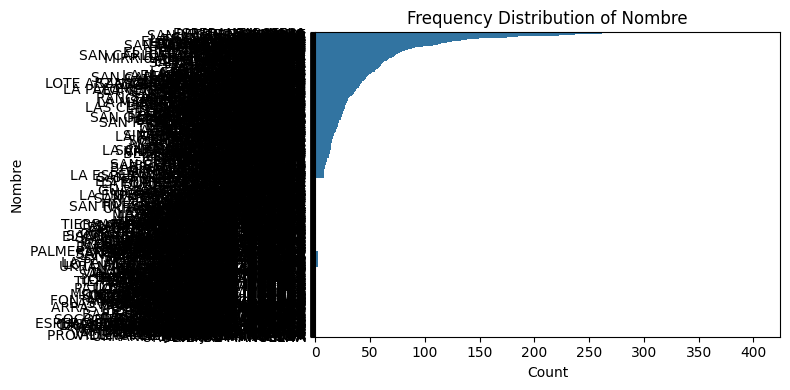

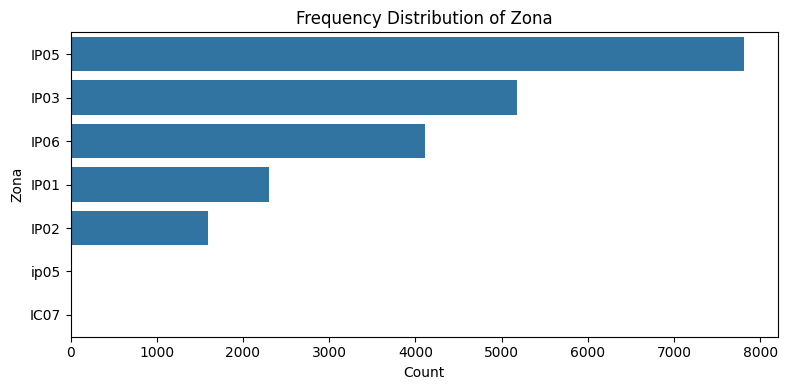

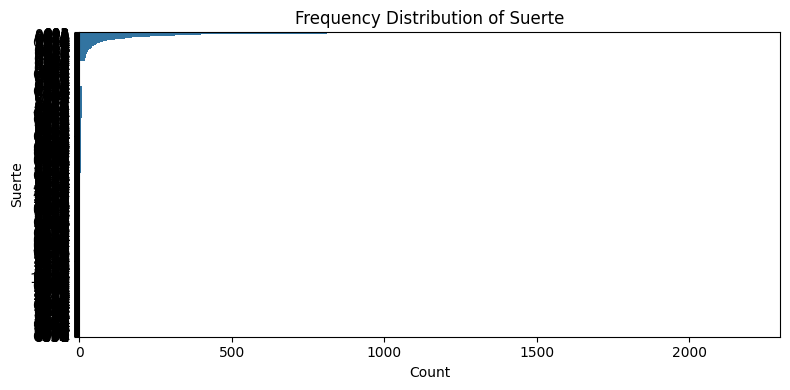

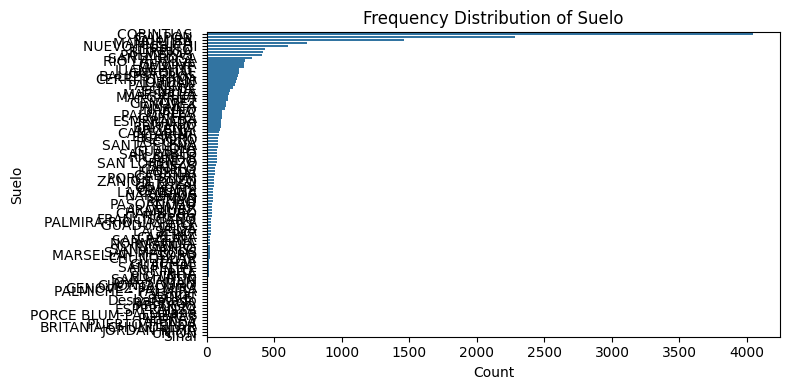

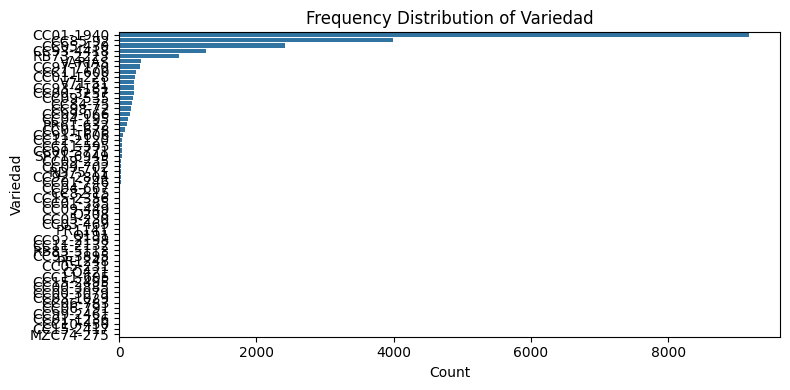

...

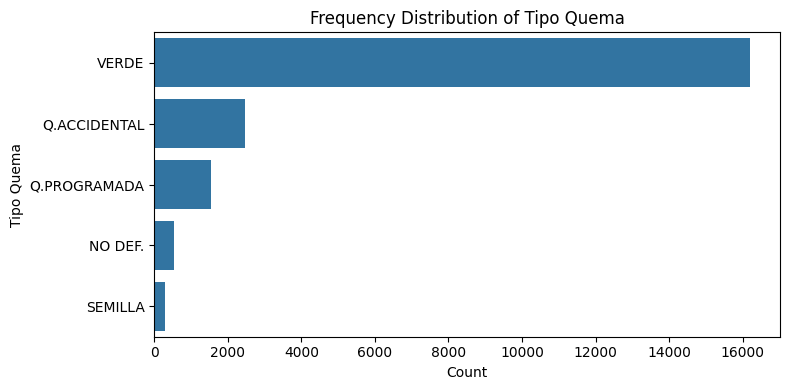

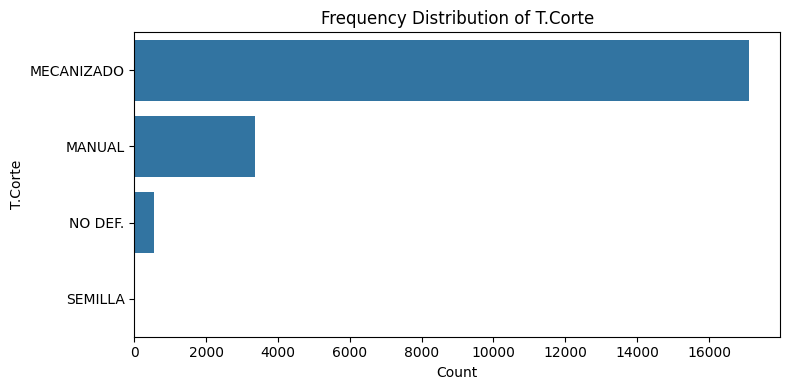

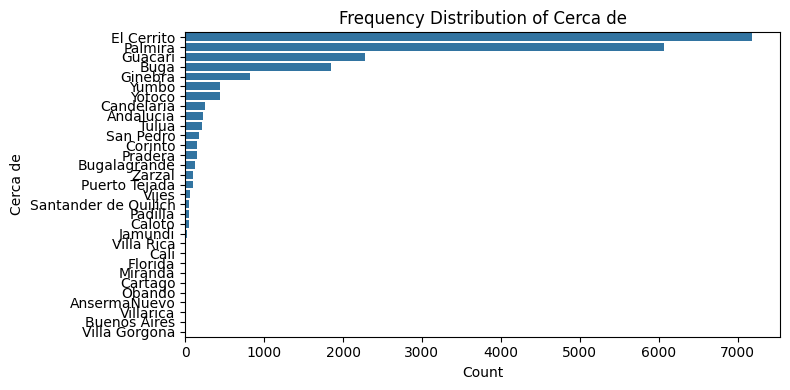

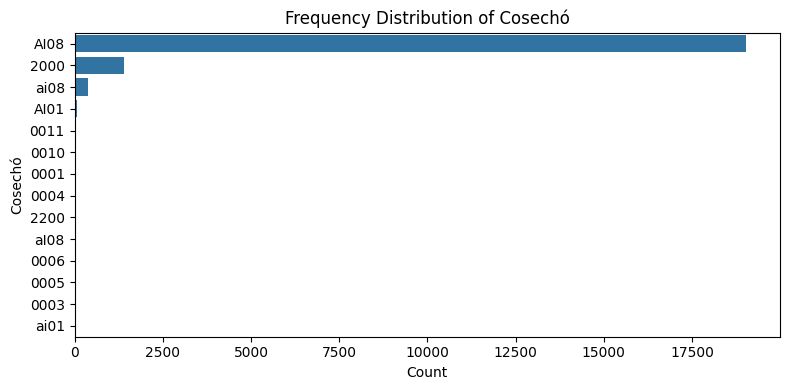

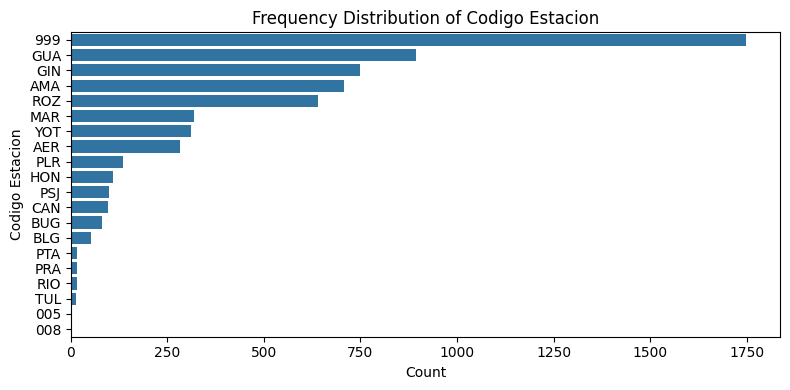

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify categorical columns
categorical_cols = df.select_dtypes(include='object').columns

# Generate frequency distribution plots for each categorical column
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df, y=col, order=df[col].value_counts().index)
    plt.title(f'Frequency Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

In [ ]:
#Eliminar variables irrelevantes
columns_to_drop1 = ['Hacienda','Tenencia', 'Nombre','Cod.Estado','Destino 1=Semilla','Cod. T.Cultivo','Cerca de','Codigo Estacion','Cosechó','D.S.','Zona','Suerte']
df = df.drop(columns=columns_to_drop1, errors='ignore')
print("Columnas restantes después de la eliminación:")
print(df.columns.tolist())

Columnas restantes después de la eliminación:
['Período', 'Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'F.Siembra', 'Ult.Riego', 'Edad Ult Cos', 'F.Ult.Corte', 'Cultivo', 'Fec.Madur.', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', 'TAH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Fert.Nitrogen.', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Sum Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporaci

In [ ]:
#Eliminar TAH porque es un parametro directo de %Porcentaje de Sacarosa y Fecha Madurante (tenemos semanas de madurante)
columns_to_drop = ['TAH','Fec.Madur.']
df = df.drop(columns=columns_to_drop, errors='ignore')
print("Columnas restantes después de la eliminación:")
print(df.columns.tolist())

Columnas restantes después de la eliminación:
['Período', 'Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'F.Siembra', 'Ult.Riego', 'Edad Ult Cos', 'F.Ult.Corte', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Fert.Nitrogen.', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Sum Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo']


## **Variables Numéricas**

**Histogramas de distribucción**

In [ ]:
import plotly.express as px

# Selección de variables númericas 'Período'
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.drop('Período', errors='ignore')


# Generar histogramas
for col in numerical_cols:
    fig = px.histogram(df, x=col, title=f'Distribución de {col}')
    fig.show()

In [ ]:
#Eliminar variables sin datos (Ningun valor)
columns_to_drop = [ 'Fert.Nitrogen.','Sum Oscilacion Temp Ciclo']
df = df.drop(columns=columns_to_drop, errors='ignore')
print("Columnas restantes después de la eliminación:")
print(df.columns.tolist())

Columnas restantes después de la eliminación:
['Período', 'Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'F.Siembra', 'Ult.Riego', 'Edad Ult Cos', 'F.Ult.Corte', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo']


## **Correlación**

In [ ]:
import plotly.express as px

# Calculate the correlation matrix
# Selección de variables númericas 'Período'
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.drop('Período', errors='ignore')
correlation_matrix = df[numerical_cols].corr()

# Generate an interactive heatmap with Plotly
fig = px.imshow(correlation_matrix,
                labels=dict(x="Variables", y="Variables", color="Correlación"),
                x=correlation_matrix.columns,
                y=correlation_matrix.index,
                title='Mapa de Calor de Correlación Interactivo',
                text_auto=True,
                color_continuous_scale='algae') # Change color scale to Peach for softer tones


fig.update_layout(xaxis_showgrid=False,
                  yaxis_showgrid=False,
                  xaxis_nticks=len(correlation_matrix.columns),
                  yaxis_nticks=len(correlation_matrix.index),
                  width=1200,  # Adjust width
                  height=1000, # Adjust height
                  font=dict(size=14)) # Adjust font size


fig.show()

**Variables de alta corr (> 0.85)**

In [ ]:
# Calculate the absolute correlation matrix
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.drop('Período', errors='ignore')
correlation_matrix = df[numerical_cols].corr().abs()

# Stack the correlation matrix and reset index
stacked_corr = correlation_matrix.stack().reset_index()

# Rename columns
stacked_corr.columns = ['Variable 1', 'Variable 2', 'Absolute Correlation']

# Filter for high correlations (excluding self-correlation)
high_corr_pairs = stacked_corr[(stacked_corr['Absolute Correlation'] >= 0.85) & (stacked_corr['Variable 1'] != stacked_corr['Variable 2'])]

# Sort by absolute correlation
high_corr_pairs = high_corr_pairs.sort_values(by='Absolute Correlation', ascending=False)

print("Pares de variables con correlación absoluta >= 0.85:")
print(high_corr_pairs)

Pares de variables con correlación absoluta >= 0.85:
                 Variable 1             Variable 2  Absolute Correlation
1541      Temp. Media Ciclo  Oscilacion Temp Ciclo              1.000000
1805  Oscilacion Temp Ciclo      Temp. Media Ciclo              1.000000
276             TonUltCorte              Area Neta              0.948529
6                 Area Neta            TonUltCorte              0.948529
1030           Luvias 9 -FC          Lluvias Ciclo              0.851217
850           Lluvias Ciclo           Luvias 9 -FC              0.851217


# ***Determinación de colinealidad***

Se filtran las variables con Correlación mayor o igual a 0.9

In [ ]:
import plotly.express as px

fig = px.scatter(df, x='Area Neta', y='TonUltCorte', title='Gráfico de Dispersión: Area Neta vs TonUltCorte')
fig.show()

In [ ]:
import plotly.express as px

fig = px.scatter(df, x='Temp. Media Ciclo', y='Oscilacion Temp Ciclo', title='Gráfico de Dispersión: Temp. Media Ciclo vs Oscilacion Temp Ciclo')
fig.show()

Con base en los gráficos se decide trabajar solo con una variable de cada par analizado.

## **Tratamiento de Columnas de Fechas**

**Selección por tipo fecha**

In [ ]:
print("Columnas de tipo fecha:")
print(list(df.select_dtypes(include='datetime64[ns]').columns))

Columnas de tipo fecha:
['F.Siembra', 'Ult.Riego', 'F.Ult.Corte']


**Separación de fechas por año y mes**

In [ ]:
import plotly.express as px
import pandas as pd

date_cols = df.select_dtypes(include='datetime64[ns]').columns

for date_col in date_cols:
    # Ensure the column is in datetime format
    df[date_col] = pd.to_datetime(df[date_col], errors='coerce')

    # Extract Month for coloring and convert to categorical with ordered months, including NaN at the end
    df[f'{date_col}_Month'] = df[date_col].dt.month
    month_order = [str(i) for i in range(1, 13)] # Create list of month strings '1' to '12'
    month_order.append(str(pd.NA)) # Add string representation of NaN to the order
    df[f'{date_col}_Month'] = df[f'{date_col}_Month'].astype(str).astype('category').cat.set_categories(month_order, ordered=True)

    # Create a histogram for TCH against the current date column, colored by month
    fig = px.histogram(df, x=date_col, y='TCH', color=f'{date_col}_Month',
                  title=f'Distribución de TCH por {date_col} (Etiquetado por Mes)',
                  labels={date_col: 'Fecha', 'TCH': 'TCH', f'{date_col}_Month': 'Mes'})

    # Format the x-axis to show month and year
    fig.update_xaxes(tickformat='%Y-%m')

    fig.show()

Se muestra la distribucción de las toneladas de caña por hectárea en cada mes, históricamente.

No hay aparente relación lineal entre Mes * Año y el TCH. Se decide entonces  utilizar en el modelo solo el mes de cada fecha. Además, el año no es una variable para predecir.

In [ ]:
import plotly.express as px
import pandas as pd

date_cols = df.select_dtypes(include='datetime64[ns]').columns

for date_col in date_cols:
    # Ensure the column is in datetime format
    df[date_col] = pd.to_datetime(df[date_col], errors='coerce')

    # Extract Year and Month
    df[f'{date_col}_Year'] = df[date_col].dt.year
    df[f'{date_col}_Month'] = df[date_col].dt.month

    # Group by Year and Month and calculate the mean of %Sac.Caña
    df_temporal = df.groupby([f'{date_col}_Year', f'{date_col}_Month']).agg(
        mean_Sac_Cana=('%Sac.Caña', 'mean')
    ).reset_index()

    # Convert Year and Month to integer and then string for creating the date column
    df_temporal[f'{date_col}_Year'] = df_temporal[f'{date_col}_Year'].fillna(0).astype(int).astype(str)
    df_temporal[f'{date_col}_Month'] = df_temporal[f'{date_col}_Month'].fillna(0).astype(int).astype(str)


    # Create a date column from Year and Month for the X-axis
    df_temporal['Fecha'] = pd.to_datetime(df_temporal[f'{date_col}_Year'] + '-' + df_temporal[f'{date_col}_Month'] + '-01', errors='coerce')

    # Sort data by date
    df_temporal = df_temporal.sort_values(by='Fecha')

    # Create line plot for mean %Sac.Caña over time, segmented by year
    if 'mean_Sac_Cana' in df_temporal.columns:
        fig = px.line(df_temporal, x='Fecha', y='mean_Sac_Cana', color=f'{date_col}_Year',
                      title=f'Promedio de %Sac.Caña por Mes y Año ({date_col})',
                      labels={'Fecha': f'Fecha ({date_col})', 'mean_Sac_Cana': 'Promedio de %Sac.Caña', f'{date_col}_Year': 'Año'})

        # Update x-axis to show monthly ticks
        fig.update_layout(xaxis = dict(
            tickvals = df_temporal['Fecha'],
            tickformat = '%Y-%m', # Format to show Year-Month
            dtick = 'M1' # Set tick interval to 1 month
        ))

        fig.show()
    else:
        print(f"'mean_Sac_Cana' not found in temporal DataFrame columns.")

Al observar en cada fecha por Mes en los diferentes año, no hay un corportamiento lineal del porcentaje de Sacarosa.

**Relación entre el Periodo y la Siembra**



In [ ]:
import pandas as pd
import plotly.express as px

# Ensure 'F.Siembra' is in datetime format
df['F.Siembra'] = pd.to_datetime(df['F.Siembra'], errors='coerce')

# Create a scatter plot of Período vs F.Siembra
fig = px.scatter(df, x='F.Siembra', y='Período',
                 title='Período vs F.Siembra',
                 labels={'F.Siembra': 'Fecha de Siembra', 'Período': 'Período'})

fig.show()

**Distribución de los Meses del Periodo**

In [ ]:
# Convert 'Período' to string and extract the last two digits
df['Período Mes'] = df['Período'].astype(str).str[-2:]

# Create a histogram of the new 'Período Mes' column
fig = px.histogram(df, x='Período Mes',
                   title='Distribución de Frecuencia de Período Mes',
                   labels={'Período Mes': 'Mes del Período', 'count': 'Frecuencia'})

# Update layout to order categories numerically on the x-axis
fig.update_layout(xaxis={'categoryorder':'category ascending'})

fig.show()

In [ ]:
import plotly.express as px

# Create box plots for TCH and %Sac.Caña against Período Mes
for col in ['TCH']:
    if col in df.columns:
        fig = px.box(df, x='Período Mes', y=col,
                     title=f'Distribución de {col} por Período Mes',
                     labels={'Período Mes': 'Mes del Período', col: col},
                     category_orders={'Período Mes': [str(i).zfill(2) for i in range(1, 13)]}) # Order months 01-12
        fig.show()
    else:
        print(f"'{col}' not found in DataFrame columns.")

In [ ]:
# Convertir la columna 'Período Mes' a entero
df['Período Mes'] = df['Período Mes'].astype(int)
print("La columna 'Período Mes' ha sido convertida a tipo entero.")
print(df['Período Mes'].dtype)

La columna 'Período Mes' ha sido convertida a tipo entero.
int64


In [ ]:
# Eliminar la columna 'Período'
columns_to_drop = ['Período']
df = df.drop(columns=columns_to_drop, errors='ignore')
print("Columnas restantes después de la eliminación:")
print(df.columns.tolist())

Columnas restantes después de la eliminación:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'F.Siembra', 'Ult.Riego', 'Edad Ult Cos', 'F.Ult.Corte', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'F.Siembra_Month', 'Ult.Riego_Month', 'F.Ult.Corte_Month', 'F.Siembr

**Frecuencia de los Meses para cada Fecha**

In [ ]:
import pandas as pd
import plotly.express as px

# Select date columns
date_cols = df.select_dtypes(include='datetime64[ns]').columns

# Create new columns for months and visualize their distribution
new_month_cols = []
for date_col in date_cols:
    # Extract month and create new column
    month_col_name = f'{date_col}_Mes'
    df[month_col_name] = df[date_col].dt.month

    # Store new column name
    new_month_cols.append(month_col_name)

    # Create histogram for the new month column
    fig = px.histogram(df, x=month_col_name,
                       title=f'Distribución de Frecuencia de {month_col_name}',
                       labels={month_col_name: 'Mes', 'count': 'Frecuencia'})
    fig.update_layout(xaxis={'categoryorder':'category ascending'}) # Order categories numerically
    fig.show()

# Drop the original date columns
df = df.drop(columns=date_cols, errors='ignore')

print("Columnas restantes después de la eliminación de las columnas de fecha originales:")
print(df.columns.tolist())

Columnas restantes después de la eliminación de las columnas de fecha originales:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'F.Siembra_Month', 'Ult.Riego_Month', 'F.Ult.Corte_Month', 'F.Siembra_Yea

**Meses de las Fechas versus la variable Objetivo TCH**

In [ ]:
import plotly.express as px

# List of the new month columns created in the previous step
month_cols = [col for col in df.columns if col.endswith('_Mes')]

# Create box plots for TCH and %Sac.Caña against each month column
for month_col in month_cols:
    for target_col in ['TCH']:
        if target_col in df.columns:
            fig = px.box(df, x=month_col, y=target_col,
                         title=f'Distribución de {target_col} por {month_col}',
                         labels={month_col: 'Mes', target_col: target_col},
                         category_orders={month_col: [str(i) for i in range(1, 13)]}) # Order months 1-12
            fig.show()
        else:
            print(f"'{target_col}' not found in DataFrame columns.")

In [ ]:
# Convertir columnas que terminan con '_Mes' a entero
month_cols = [col for col in df.columns if col.endswith('_Mes')]
for col in month_cols:
    df[col] = df[col].fillna(0).astype(int) # Fill NaN with 0 before converting to int
    print(f"La columna '{col}' ha sido convertida a tipo entero.")

print("\nTipos de datos de las columnas que terminan con '_Mes':")
print(df[month_cols].dtypes)

La columna 'F.Siembra_Mes' ha sido convertida a tipo entero.
La columna 'Ult.Riego_Mes' ha sido convertida a tipo entero.
La columna 'F.Ult.Corte_Mes' ha sido convertida a tipo entero.

Tipos de datos de las columnas que terminan con '_Mes':
F.Siembra_Mes      int64
Ult.Riego_Mes      int64
F.Ult.Corte_Mes    int64
dtype: object


## **Datos Nulos y Outliers**

In [ ]:
print("Cantidad de valores nulos por columna:")
null_counts = df.isnull().sum()
print(null_counts[null_counts > 0])

Cantidad de valores nulos por columna:
Suelo                       3758
Dist Km                        5
Cultivo                        2
Producto                    9778
Dosis Madurante              104
Semanas mad.                9775
%Sac.Caña                    449
%Fibra Caña                 1858
%ME Min                     1722
%ME Veg                     1720
%ME Tot                     1720
Vejez                       2445
Num.Riegos                 12589
%Infest.Diatrea            15427
Urea 46%                   20304
MEZ                        20056
Boro Granul.               19742
MicroZinc                  19878
NITO_XTEND                 17348
Sul.Amonio                 19670
NITRAX-S                   20279
Vinaza                     16929
Temp. Media 0-3            16497
Temp. Media Ciclo          16497
Temp Max Ciclo             16497
Temp Min Ciclo             16497
Humedad Rel Media 0-3      16497
Humedad Rel Media Ciclo    16497
Oscilacion Temp Med 0-3    16497
Osci

### **Rellenar los columnas con valores nulos por Cero**

Rellenar con Cero los Nulos de variables que si pueden ser cero

In [ ]:
# Rellenar valores nulos con cero para columnas específicas
cols_to_fill_zero = ['Dosis Madurante', 'Semanas mad.', '%Infest.Diatrea', 'Vejez']
for col in cols_to_fill_zero:
    if col in df.columns:
        df[col] = df[col].fillna(0)
        print(f"Valores nulos en '{col}' llenados con cero.")
    else:
        print(f"La columna '{col}' no se encuentra en el DataFrame.")

print("\nCantidad de valores nulos después de rellenar con cero:")
null_counts = df.isnull().sum()
print(null_counts[null_counts > 0])

Valores nulos en 'Dosis Madurante' llenados con cero.
Valores nulos en 'Semanas mad.' llenados con cero.
Valores nulos en '%Infest.Diatrea' llenados con cero.
Valores nulos en 'Vejez' llenados con cero.

Cantidad de valores nulos después de rellenar con cero:
Suelo                       3758
Dist Km                        5
Cultivo                        2
Producto                    9778
%Sac.Caña                    449
%Fibra Caña                 1858
%ME Min                     1722
%ME Veg                     1720
%ME Tot                     1720
Num.Riegos                 12589
Urea 46%                   20304
MEZ                        20056
Boro Granul.               19742
MicroZinc                  19878
NITO_XTEND                 17348
Sul.Amonio                 19670
NITRAX-S                   20279
Vinaza                     16929
Temp. Media 0-3            16497
Temp. Media Ciclo          16497
Temp Max Ciclo             16497
Temp Min Ciclo             16497
Humedad Rel Me

In [ ]:
import plotly.express as px

fig = px.box(df, y='DDUlt.Riego', title='Box Plot de DDUlt.Riego')
fig.show()

In [ ]:
# Eliminar la columna 'DDUlt.Riego' de df
df = df.drop(columns=['DDUlt.Riego'], errors='ignore')
print("Columnas restantes en df después de la eliminación:")
print(df.columns.tolist())

Columnas restantes en df después de la eliminación:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'T.Corte', 'Num.Riegos', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'F.Siembra_Month', 'Ult.Riego_Month', 'F.Ult.Corte_Month', 'F.Siembra_Year', 'Ult.Riego_Year', 'F.Ult.Corte_Year', 'Pe

### **Cambio a Variable Binaria por desbalance de características (Tipo de Corte)**

In [ ]:
# Convertir la columna 'T.Corte' a binaria
df['T.Corte_MECANIZADO'] = df['T.Corte'].apply(lambda x: 1 if x == 'MECANIZADO' else 0)

# Opcional: Eliminar la columna original 'T.Corte'
# df = df.drop(columns=['T.Corte'], errors='ignore')

print("Nueva columna 'T.Corte_MECANIZADO' creada.")
print("Primeras filas con la nueva columna:")
display(df[['T.Corte', 'T.Corte_MECANIZADO']].head())

Nueva columna 'T.Corte_MECANIZADO' creada.
Primeras filas con la nueva columna:


,T.Corte,T.Corte_MECANIZADO
0,MECANIZADO,1
1,MANUAL,0
2,MECANIZADO,1
3,MANUAL,0
4,MANUAL,0


In [ ]:
# Eliminar la columna 'T.Corte'
df = df.drop(columns=['T.Corte'], errors='ignore')
print("Columna 'T.Corte' eliminada.")
print("Columnas restantes después de la eliminación:")
print(df.columns.tolist())

Columna 'T.Corte' eliminada.
Columnas restantes después de la eliminación:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'Num.Riegos', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'F.Siembra_Month', 'Ult.Riego_Month', 'F.Ult.Corte_Month', 'F.Siembra_Year', 'Ult.Riego_Year', 'F.Ult.Cort

### **Columnas con tratamiento de Agrupación de datos**

In [ ]:
import numpy as np

# 1. Estandarizar el nombre del producto
df['Producto'] = df['Producto'].replace('BONUS 250 EC REGULADOR FISIOLÓGICO', 'BONUS 250 EC REGULADOR FISIOLOGICO')
print("Nombre del producto estandarizado.")

# 2. Si Dosis Madurante es igual a Cero, poner Producto en NaN
df.loc[df['Dosis Madurante'] == 0, 'Producto'] = "SIN PRODUCTO"
print("Producto establecido a 'SIN PRODUCTO' donde Dosis Madurante es cero.")


# 3. Mostrar la cantidad de valores nulos después de los cambios
print("\nCantidad de valores nulos después de los cambios:")
null_counts = df.isnull().sum()
print(null_counts[null_counts > 0])

Nombre del producto estandarizado.
Producto establecido a 'SIN PRODUCTO' donde Dosis Madurante es cero.

Cantidad de valores nulos después de los cambios:
Suelo                       3758
Dist Km                        5
Cultivo                        2
Producto                       3
%Sac.Caña                    449
%Fibra Caña                 1858
%ME Min                     1722
%ME Veg                     1720
%ME Tot                     1720
Num.Riegos                 12589
Urea 46%                   20304
MEZ                        20056
Boro Granul.               19742
MicroZinc                  19878
NITO_XTEND                 17348
Sul.Amonio                 19670
NITRAX-S                   20279
Vinaza                     16929
Temp. Media 0-3            16497
Temp. Media Ciclo          16497
Temp Max Ciclo             16497
Temp Min Ciclo             16497
Humedad Rel Media 0-3      16497
Humedad Rel Media Ciclo    16497
Oscilacion Temp Med 0-3    16497
Oscilacion Temp Cicl

In [ ]:
# Mostrar la frecuencia de los valores en la columna 'Producto'
print("Frecuencia de los valores en la columna 'Producto':")
print(df['Producto'].value_counts())

# Visualizar la frecuencia con un gráfico de barras
# Calculate value counts and reset index
product_counts = df['Producto'].value_counts().reset_index()
# Rename the columns for clarity
product_counts.columns = ['Producto', 'Frecuencia']

fig = px.bar(product_counts,
             x='Producto', y='Frecuencia',
             title='Distribución de Frecuencia de Producto',
             labels={'Producto': 'Producto', 'Frecuencia': 'Frecuencia'})
fig.show()

Frecuencia de los valores en la columna 'Producto':
Producto
BONUS 250 EC REGULADOR FISIOLOGICO       10381
SIN PRODUCTO                              9789
COADYUVANTE  DOUCE                         380
FERTILIZANTE LIQUIDO RENDIMIENTO           179
FUSILADE 2000 BL                            84
AGROFOSK-M                                  54
MADURANTE REGULADOR TRONNUSPAC 250 EC       36
FERTILIZANTE ORGÁNICO PATER-M               31
ROUND-UP MONSANTO 747 GRANULADO             29
PRODUCTO ENSAYO EN LITROS                   18
MADURANTE BIO SAFE ORGANIC                  17
baykal                                       9
TRANSLOK                                     7
OTROS MADURANTES                             4
GREEN LIFE                                   3
AMINA 2-4-D                                  2
GLIFOLAQ                                     1
Name: count, dtype: int64


In [ ]:
# Calculate the frequency of each product
product_counts = df['Producto'].value_counts()

# Identify products with frequency less than or equal to 380
products_to_group = product_counts[product_counts <= 380].index

# Replace these products with 'OTROS MADURANTES'
df['Producto'] = df['Producto'].replace(products_to_group, 'OTROS MADURANTES')

print("Categorías de Producto con frecuencia <= 380 agrupadas como 'OTROS MADURANTES'.")
print("\nNueva frecuencia de los valores en la columna 'Producto':")
print(df['Producto'].value_counts())

Categorías de Producto con frecuencia <= 380 agrupadas como 'OTROS MADURANTES'.

Nueva frecuencia de los valores en la columna 'Producto':
Producto
BONUS 250 EC REGULADOR FISIOLOGICO    10381
SIN PRODUCTO                           9789
OTROS MADURANTES                        854
Name: count, dtype: int64


In [ ]:
# Visualizar la frecuencia con un gráfico de barras
# Calculate value counts and reset index
product_counts = df['Producto'].value_counts().reset_index()
# Rename the columns for clarity
product_counts.columns = ['Producto', 'Frecuencia']

fig = px.bar(product_counts,
             x='Producto', y='Frecuencia',
             title='Distribución de Frecuencia de Producto',
             labels={'Producto': 'Producto', 'Frecuencia': 'Frecuencia'})
fig.show()

In [ ]:
# Generate histogram for 'Variedad'
fig_variedad = px.histogram(df, x='Variedad', title='Distribución de Frecuencia de Variedad')
fig_variedad.update_layout(xaxis={'categoryorder':'total descending'}) # Order by frequency
fig_variedad.show()

# Generate histogram for 'Suelo'
fig_suelo = px.histogram(df, x='Suelo', title='Distribución de Frecuencia de Suelo')
fig_suelo.update_layout(xaxis={'categoryorder':'total descending'}) # Order by frequency
fig_suelo.show()

In [ ]:
# Calculate the frequency of each variety
variedad_counts = df['Variedad'].value_counts()

# Identify varieties with frequency less than 115
variedades_to_group = variedad_counts[variedad_counts < 200].index

# Replace these varieties with 'Otros'
df['Variedad'] = df['Variedad'].replace(variedades_to_group, 'Otros')

print("Categorías de Variedad con frecuencia < 200 agrupadas como 'Otros'.")
print("\nNueva frecuencia de los valores en la columna 'Variedad':")
print(df['Variedad'].value_counts())

Categorías de Variedad con frecuencia < 200 agrupadas como 'Otros'.

Nueva frecuencia de los valores en la columna 'Variedad':
Variedad
CC01-1940    9172
CC85-92      3997
CC05-430     2415
Otros        1346
CC93-4418    1263
RB73-2223     872
VARIAS        324
CC97-7170     303
CC11-600      248
CC01-1228     235
V71-51        222
CC93-4181     215
CC00-3257     215
CC09-535      200
Name: count, dtype: int64


In [ ]:
# Calculate the frequency of each soil type
suelo_counts = df['Suelo'].value_counts()

# Identify soil types with frequency less than 40
suelos_to_group = suelo_counts[suelo_counts <= 40]

# Calculate the sum of frequencies for these soil types
sum_low_frequency_suelo = suelos_to_group.sum()

print(f"La suma de las frecuencias para las categorías en 'Suelo' con frecuencia menor a 40 es: {sum_low_frequency_suelo}")

La suma de las frecuencias para las categorías en 'Suelo' con frecuencia menor a 40 es: 793


In [ ]:
# Calculate the frequency of each soil type
suelo_counts = df['Suelo'].value_counts()

# Identify soil types with frequency less than or equal to 40
suelos_to_group = suelo_counts[suelo_counts <= 40].index

# Replace these soil types with 'Otros'
df['Suelo'] = df['Suelo'].replace(suelos_to_group, 'Otros')

print("Categorías de Suelo con frecuencia <= 40 agrupadas como 'Otros'.")
print("\nNueva frecuencia de los valores en la columna 'Suelo':")
print(df['Suelo'].value_counts())

Categorías de Suelo con frecuencia <= 40 agrupadas como 'Otros'.

Nueva frecuencia de los valores en la columna 'Suelo':
Suelo
CORINTIAS         4042
GALPON            2282
PALMIRA           1457
Otros              793
MANUELITA          742
NUEVO PICHICHI     599
CERRITO            431
BURRIGA            415
PALMERAS           407
SANTA ROSA         336
RIO LA PAILA       285
GENOVA             278
AMAIME             272
JUANCHITO          239
GUADUAL            236
BALLESTEROS        229
CERRITO-NIMA       227
JORDAN             213
PALMICHE           210
NIMA               195
ESNEDA             170
MARSELLA           167
MARGARITA          158
TIBET              156
GENOVEZ            139
JAMAICA            139
NARINO             132
VILLA              115
PALMIRITA          115
OVEJERA            110
ESMERALDA          107
YUMBO              106
BRITANIA           104
ARGELIA             96
PICHICHI            88
CANTARINA           88
TESORO              86
SANTA ELENA         85

## **Manejo de la Variable Objetivo**

---



Se tiene en cuenta que valores inferiores a 50 TCH y mayores a 215 TCH son valores atípicos

In [ ]:
# Filtrar el DataFrame para mantener los valores de TCH entre 47 (minimo cola inferior) y 215(maximo cola superior) de los cuartiles
df_filtered = df[(df['TCH'] >= 47) & (df['TCH'] <= 215)].copy()

print("DataFrame filtrado para TCH entre 47 y 215.")
print("Dimensiones del DataFrame filtrado:", df_filtered.shape)

DataFrame filtrado para TCH entre 47 y 215.
Dimensiones del DataFrame filtrado: (20734, 61)


**Verficar nulos nuevamente y columnas**

In [ ]:
null_counts = df_filtered.isnull().sum()
print("Cantidad de valores nulos en el DataFrame filtrado:")
print(null_counts[null_counts > 0])

Cantidad de valores nulos en el DataFrame filtrado:
Suelo                       3684
Dist Km                        4
Cultivo                        2
Producto                       3
%Sac.Caña                    421
%Fibra Caña                 1816
%ME Min                     1670
%ME Veg                     1668
%ME Tot                     1668
Num.Riegos                 12393
Urea 46%                   20018
MEZ                        19774
Boro Granul.               19464
MicroZinc                  19596
NITO_XTEND                 17087
Sul.Amonio                 19386
NITRAX-S                   19991
Vinaza                     16667
Temp. Media 0-3            16256
Temp. Media Ciclo          16256
Temp Max Ciclo             16256
Temp Min Ciclo             16256
Humedad Rel Media 0-3      16256
Humedad Rel Media Ciclo    16256
Oscilacion Temp Med 0-3    16256
Oscilacion Temp Ciclo      16256
Radicion Solar 0-3         16256
Radiacion Solar Ciclo      16256
Precipitacion 0_3       

In [ ]:
# Eliminar la columna 'Ult.Riego_Year'
df_filtered = df_filtered.drop(columns=['Ult.Riego_Year'], errors='ignore')
print("Columna 'Ult.Riego_Year' eliminada.")

# Renombrar la columna 'Ult.Riego_Month' a 'Ult.Riego_Mes'
df_filtered = df_filtered.rename(columns={'Ult.Riego_Month': 'Ult.Riego_Mes'})
print("Columna 'Ult.Riego_Month' renombrada a 'Ult.Riego_Mes'.")

print("\nColumnas restantes en df_filtered después de los cambios:")
print(df_filtered.columns.tolist())

Columna 'Ult.Riego_Year' eliminada.
Columna 'Ult.Riego_Month' renombrada a 'Ult.Riego_Mes'.

Columnas restantes en df_filtered después de los cambios:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'Num.Riegos', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'F.Siembra_Month', 'Ult.Riego_

## **Dataframe para Experimento con Datos Climatológicos**

In [ ]:
# Crear un nuevo DataFrame (df2) filtrando las filas donde 'Temp. Media 0-3' no es nulo
df2 = df_filtered.dropna(subset=['Temp. Media 0-3']).copy()

print("Nuevo DataFrame df2 creado con filas donde 'Temp. Media 0-3' no es nulo.")
print("Dimensiones de df2:", df2.shape)

Nuevo DataFrame df2 creado con filas donde 'Temp. Media 0-3' no es nulo.
Dimensiones de df2: (4478, 60)


In [ ]:
nulls = df2.isnull().sum()
print("Cantidad de valores nulos en el DataFrame df2:")
print(nulls[nulls > 0])

Cantidad de valores nulos en el DataFrame df2:
Suelo             202
%Sac.Caña         146
%Fibra Caña       300
%ME Min           294
%ME Veg           294
%ME Tot           294
Num.Riegos       2556
Urea 46%         4478
MEZ              4449
Boro Granul.     4337
MicroZinc        4385
NITO_XTEND       3424
Sul.Amonio       4177
NITRAX-S         4323
Vinaza           2988
Ult.Riego_Mes    2555
dtype: int64


## **Manejar nulls mayores o iguales al 50% en los Df (df y df2)**

se crea ademas de df2, un df_filtered

In [ ]:
# Function to drop columns with >= 50% null values
def drop_high_null_cols(dataframe, df_name):
    null_counts = dataframe.isnull().sum()
    cols_to_drop = null_counts[null_counts / len(dataframe) >= 0.5].index.tolist()
    if cols_to_drop:
        dataframe = dataframe.drop(columns=cols_to_drop, errors='ignore')
        print(f"Columnas eliminadas de {df_name} (>= 50% nulos): {cols_to_drop}")
    else:
        print(f"No hay columnas con >= 50% nulos en {df_name}.")
    return dataframe

# Drop columns from df_filtered (copia del df)
df_filtered = drop_high_null_cols(df_filtered, 'df_filtered')

# Drop columns from df2
df2 = drop_high_null_cols(df2, 'df2')

print("\nColumnas restantes en df_filtered:")
print(df_filtered.columns.tolist())

print("\nColumnas restantes en df2:")
print(df2.columns.tolist())

Columnas eliminadas de df_filtered (>= 50% nulos): ['Num.Riegos', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Temp. Media 0-3', 'Temp. Media Ciclo', 'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ', 'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Oscilacion Temp Ciclo', 'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3', 'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'Ult.Riego_Mes']
Columnas eliminadas de df2 (>= 50% nulos): ['Num.Riegos', 'Urea 46%', 'MEZ', 'Boro Granul.', 'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza', 'Ult.Riego_Mes']

Columnas restantes en df_filtered:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', '

In [ ]:
print("Shape of df_filtered:", df_filtered.shape)
print("Shape of df2:", df2.shape)

Shape of df_filtered: (20734, 35)
Shape of df2: (4478, 49)


**Verificar nulos de los df**

In [ ]:
print("Null counts for df_filtered:")
print(df_filtered.isnull().sum()[df_filtered.isnull().sum() > 0])

print("\nNull counts for df2:")
print(df2.isnull().sum()[df2.isnull().sum() > 0])

Null counts for df_filtered:
Suelo          3684
Dist Km           4
Cultivo           2
Producto          3
%Sac.Caña       421
%Fibra Caña    1816
%ME Min        1670
%ME Veg        1668
%ME Tot        1668
dtype: int64

Null counts for df2:
Suelo          202
%Sac.Caña      146
%Fibra Caña    300
%ME Min        294
%ME Veg        294
%ME Tot        294
dtype: int64


## **Pre procesamiento**

### **Transformar los datos que contienen Mes**



*   Transformar datos de Mes en formato ciclico



**Verificar datos únicos**

In [ ]:
# Mostrar valores únicos de columnas que terminan con '_Mes' or '_Month' para df_filtered
month_cols_filtered = [col for col in df_filtered.columns if col.endswith('_Mes') or col.endswith('_Month')]
print("Valores únicos en columnas de df_filtered que terminan con '_Mes' or '_Month':")
for col in month_cols_filtered:
    print(f"\nUnique values in '{col}':")
    print(df_filtered[col].unique())

# Mostrar valores únicos de columnas que terminan con '_Mes' or '_Month' para df2
month_cols_df2 = [col for col in df2.columns if col.endswith('_Mes') or col.endswith('_Month')]
print("\nValores únicos en columnas de df2 que terminan con '_Mes' or '_Month':")
for col in month_cols_df2:
    print(f"\nUnique values in '{col}':")
    print(df2[col].unique())

Valores únicos en columnas de df_filtered que terminan con '_Mes' or '_Month':

Unique values in 'F.Siembra_Month':
[ 8  1 10  3  9 12  2 11  4  7  5  6]

Unique values in 'F.Ult.Corte_Month':
[ 1  2  3  4  5  6  7  8  9 10 11 12]

Unique values in 'F.Siembra_Mes':
[ 8  1 10  3  9 12  2 11  4  7  5  6]

Unique values in 'F.Ult.Corte_Mes':
[ 1  2  3  4  5  6  7  8  9 10 11 12]

Valores únicos en columnas de df2 que terminan con '_Mes' or '_Month':

Unique values in 'F.Siembra_Month':
[11  2  4  7 10 12  5  1  6  9  3  8]

Unique values in 'F.Ult.Corte_Month':
[ 2  3  4  5  6  7  8  9 10 11 12  1]

Unique values in 'F.Siembra_Mes':
[11  2  4  7 10 12  5  1  6  9  3  8]

Unique values in 'F.Ult.Corte_Mes':
[ 2  3  4  5  6  7  8  9 10 11 12  1]


**Eliminar columnas redundantes de meses**

In [ ]:
# Eliminar las columnas especificadas de ambos DataFrames
cols_to_drop = ['F.Ult.Corte_Month', 'F.Siembra_Month']

df_filtered = df_filtered.drop(columns=cols_to_drop, errors='ignore')
df2 = df2.drop(columns=cols_to_drop, errors='ignore')

print(f"Columnas {cols_to_drop} eliminadas de df_filtered y df2.")

print("\nColumnas restantes en df_filtered:")
print(df_filtered.columns.tolist())

print("\nColumnas restantes en df2:")
print(df2.columns.tolist())

Columnas ['F.Ult.Corte_Month', 'F.Siembra_Month'] eliminadas de df_filtered y df2.

Columnas restantes en df_filtered:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'F.Siembra_Year', 'F.Ult.Corte_Year', 'Período Mes', 'F.Siembra_Mes', 'F.Ult.Corte_Mes', 'T.Corte_MECANIZADO']

Columnas restantes en df2:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias se

In [ ]:
print("Unique values in 'Período Mes' for df_filtered:")
print(df_filtered['Período Mes'].unique())

print("\nUnique values in 'Período Mes' for df2:")
print(df2['Período Mes'].unique())

Unique values in 'Período Mes' for df_filtered:
[ 1  4  2  3  5  6  7  8  9 10 11 12]

Unique values in 'Período Mes' for df2:
[ 2  3  4  5  6  7  8  9 10 11 12  1]


**Transformación de los meses en variable cíclica (Mét Seno y Coseno)**

In [ ]:
import numpy as np

month_cols = ['Período Mes', 'F.Siembra_Mes', 'F.Ult.Corte_Mes']

for df_name, df in [('df_filtered', df_filtered), ('df2', df2)]:
    print(f"Processing {df_name}...")
    for col in month_cols:
        if col in df.columns:
            # Convert to integer (already done in previous steps but good to ensure)
            df[col] = df[col].fillna(0).astype(int)

            # Apply sine and cosine transformations
            df[f'{col}_sin'] = np.sin(2 * np.pi * df[col] / 12)
            df[f'{col}_cos'] = np.cos(2 * np.pi * df[col] / 12)
            print(f"Applied cyclical features to '{col}' in {df_name}.")
        else:
            print(f"Column '{col}' not found in {df_name}.")

print("\nCyclical features created for specified month columns.")

Processing df_filtered...
Applied cyclical features to 'Período Mes' in df_filtered.
Applied cyclical features to 'F.Siembra_Mes' in df_filtered.
Applied cyclical features to 'F.Ult.Corte_Mes' in df_filtered.
Processing df2...
Applied cyclical features to 'Período Mes' in df2.
Applied cyclical features to 'F.Siembra_Mes' in df2.
Applied cyclical features to 'F.Ult.Corte_Mes' in df2.

Cyclical features created for specified month columns.


In [ ]:
print("Info for df_filtered:")
df_filtered.info()

print("\nInfo for df2:")
df2.info()

Info for df_filtered:
<class 'pandas.core.frame.DataFrame'>
Index: 20734 entries, 0 to 21026
Data columns (total 39 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Suelo                   17050 non-null  object 
 1   Area Neta               20734 non-null  float64
 2   Dist Km                 20730 non-null  float64
 3   Variedad                20734 non-null  object 
 4   Cod.Estado #            20734 non-null  int64  
 5   Edad Ult Cos            20734 non-null  float64
 6   Cultivo                 20732 non-null  object 
 7   Producto                20731 non-null  object 
 8   Dosis Madurante         20734 non-null  float64
 9   Semanas mad.            20734 non-null  float64
 10  TonUltCorte             20734 non-null  float64
 11  TCH                     20734 non-null  float64
 12  %Sac.Caña               20313 non-null  float64
 13  %Fibra Caña             18918 non-null  float64
 14  %ME Min              

In [ ]:
# Eliminar las columnas especificadas de ambos DataFrames
cols_to_drop = ['F.Siembra_Year', 'F.Ult.Corte_Year', 'Período Mes', 'F.Siembra_Mes', 'F.Ult.Corte_Mes']

df_filtered = df_filtered.drop(columns=cols_to_drop, errors='ignore')
df2 = df2.drop(columns=cols_to_drop, errors='ignore')

print(f"Columnas {cols_to_drop} eliminadas de df_filtered y df2.")

print("\nColumnas restantes en df_filtered:")
print(df_filtered.columns.tolist())

print("\nColumnas restantes en df2:")
print(df2.columns.tolist())

Columnas ['F.Siembra_Year', 'F.Ult.Corte_Year', 'Período Mes', 'F.Siembra_Mes', 'F.Ult.Corte_Mes'] eliminadas de df_filtered y df2.

Columnas restantes en df_filtered:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'T.Corte_MECANIZADO', 'Período Mes_sin', 'Período Mes_cos', 'F.Siembra_Mes_sin', 'F.Siembra_Mes_cos', 'F.Ult.Corte_Mes_sin', 'F.Ult.Corte_Mes_cos']

Columnas restantes en df2:
['Suelo', 'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Edad Ult Cos', 'Cultivo', 'Producto', 'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', '%Sac.Caña', '%Fibra Caña', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Tipo Quema', 'M3 Riego', 'Lluvia

### **Imputar Nulos con KNN**

**Verificar nuevamente nulos**

In [ ]:
print("Null counts for df_filtered:")
print(df_filtered.isnull().sum()[df_filtered.isnull().sum() > 0])

print("\nNull counts for df2:")
print(df2.isnull().sum()[df2.isnull().sum() > 0])

Null counts for df_filtered:
Suelo          3684
Dist Km           4
Cultivo           2
Producto          3
%Sac.Caña       421
%Fibra Caña    1816
%ME Min        1670
%ME Veg        1668
%ME Tot        1668
dtype: int64

Null counts for df2:
Suelo          202
%Sac.Caña      146
%Fibra Caña    300
%ME Min        294
%ME Veg        294
%ME Tot        294
dtype: int64


**Aplicación del Método de KNN para variables númericas**

In [ ]:
from sklearn.impute import KNNImputer

# Identify numerical columns for imputation in df_filtered
numerical_cols_filtered = df_filtered.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Apply KNN Imputation to df_filtered
imputer_filtered = KNNImputer(n_neighbors=5)
df_filtered[numerical_cols_filtered] = imputer_filtered.fit_transform(df_filtered[numerical_cols_filtered])

print("KNN imputation applied to numerical columns in df_filtered.")

# Identify numerical columns for imputation in df2
numerical_cols_df2 = df2.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Apply KNN Imputation to df2
imputer_df2 = KNNImputer(n_neighbors=5)
df2[numerical_cols_df2] = imputer_df2.fit_transform(df2[numerical_cols_df2])

print("KNN imputation applied to numerical columns in df2.")

print("\nNull counts after KNN imputation for df_filtered:")
print(df_filtered.isnull().sum()[df_filtered.isnull().sum() > 0])

print("\nNull counts after KNN imputation for df2:")
print(df2.isnull().sum()[df2.isnull().sum() > 0])

KNN imputation applied to numerical columns in df_filtered.
KNN imputation applied to numerical columns in df2.

Null counts after KNN imputation for df_filtered:
Suelo       3684
Cultivo        2
Producto       3
dtype: int64

Null counts after KNN imputation for df2:
Suelo    202
dtype: int64


**Imputar con 'Desconocido' los datos null de la variable Suelo**

In [ ]:
# Impute null values in 'Suelo' and 'Producto' with 'Desconocido' in df_filtered
for col in ['Suelo']:
    if col in df_filtered.columns:
        df_filtered[col] = df_filtered[col].fillna('Desconocido')
        print(f"Null values in '{col}' in df_filtered imputed with 'Desconocido'.")
    else:
        print(f"Column '{col}' not found in df_filtered.")

print("\nRemaining null counts for df_filtered after handling:")
print(df_filtered.isnull().sum()[df_filtered.isnull().sum() > 0])

Null values in 'Suelo' in df_filtered imputed with 'Desconocido'.

Remaining null counts for df_filtered after handling:
Cultivo     2
Producto    3
dtype: int64


**Eliminar datos null de las variables Cultivo y Producto**

Para ambas columnas son muy pocos datos null, se decide eliminar esas filas

In [ ]:
# Eliminar filas con valores nulos en 'Cultivo' y 'Producto' en df_filtered
df_filtered.dropna(subset=['Cultivo', 'Producto'], inplace=True)
print("Filas con valores nulos en 'Cultivo' y 'Producto' eliminadas de df_filtered.")

print("\nRemaining null counts for df_filtered after handling:")
print(df_filtered.isnull().sum()[df_filtered.isnull().sum() > 0])

Filas con valores nulos en 'Cultivo' y 'Producto' eliminadas de df_filtered.

Remaining null counts for df_filtered after handling:
Series([], dtype: int64)


In [ ]:
# Impute null values in 'Suelo' with 'Desconocido' in df2
if 'Suelo' in df2.columns:
    df2['Suelo'] = df2['Suelo'].fillna('Desconocido')
    print("Null values in 'Suelo' in df2 imputed with 'Desconocido'.")
else:
    print("Column 'Suelo' not found in df2.")

print("\nRemaining null counts for df2 after handling:")
print(df2.isnull().sum()[df2.isnull().sum() > 0])

Null values in 'Suelo' in df2 imputed with 'Desconocido'.

Remaining null counts for df2 after handling:
Series([], dtype: int64)


## **Dividir los datos en Train y Test**

**Dividir los datos para Df1 Modelo TCH**




In [ ]:
# Copiar df_filtered a df1
df1 = df_filtered.copy()

print("df_filtered copiado a df1.")
print("Dimensiones de df1:", df1.shape)

df_filtered copiado a df1.
Dimensiones de df1: (20729, 34)


In [ ]:
from sklearn.model_selection import train_test_split

# Define features (X) and target (y) for df1
# Exclude 'TCH', 'Vejez', '%Sac.Caña' from features
X1 = df1.drop(columns=['TCH', 'Vejez', '%Sac.Caña'], errors='ignore')
y1 = df1['TCH']

# Split df1 into training and testing sets (e.g., 80% train, 20% test)
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

print("df1 split into training and testing sets.")
print("Shape of X1_train:", X1_train.shape)
print("Shape of X1_test:", X1_test.shape)
print("Shape of y1_train:", y1_train.shape)
print("Shape of y1_test:", y1_test.shape)

df1 split into training and testing sets.
Shape of X1_train: (16583, 31)
Shape of X1_test: (4146, 31)
Shape of y1_train: (16583,)
Shape of y1_test: (4146,)


### **Transformación de Columnas**

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

# Identify numerical and categorical columns for df1
all_numerical_cols_df1 = X1_train.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_cols_df1 = X1_train.select_dtypes(include=['object', 'category']).columns.tolist()

# Define the columns to exclude from scaling (binary and cyclical features)
cols_to_exclude_scaling = [
    'T.Corte_MECANIZADO',
    'Período Mes_sin',
    'Período Mes_cos',
    'F.Siembra_Mes_sin',
    'F.Siembra_Mes_cos',
    'F.Ult.Corte_Mes_sin',
    'F.Ult.Corte_Mes_cos'
]

# Identify numerical columns to be scaled (excluding the excluded columns)
numerical_cols_to_scale_df1 = [col for col in all_numerical_cols_df1 if col not in cols_to_exclude_scaling]

# Identify columns to be passed through
cols_to_passthrough = cols_to_exclude_scaling


# Create separate transformers
scaler = StandardScaler()
onehot = OneHotEncoder(handle_unknown='ignore')

# Apply scaling to numerical columns
X1_train_scaled = scaler.fit_transform(X1_train[numerical_cols_to_scale_df1])
X1_test_scaled = scaler.transform(X1_test[numerical_cols_to_scale_df1])
X1_train_scaled = pd.DataFrame(X1_train_scaled, columns=numerical_cols_to_scale_df1, index=X1_train.index)
X1_test_scaled = pd.DataFrame(X1_test_scaled, columns=numerical_cols_to_scale_df1, index=X1_test.index)


# Apply one-hot encoding to categorical columns
X1_train_onehot = onehot.fit_transform(X1_train[categorical_cols_df1])
X1_test_onehot = onehot.transform(X1_test[categorical_cols_df1])

# Get feature names for one-hot encoded columns
onehot_feature_names = onehot.get_feature_names_out(categorical_cols_df1)

X1_train_onehot = pd.DataFrame(X1_train_onehot.toarray(), columns=onehot_feature_names, index=X1_train.index)
X1_test_onehot = pd.DataFrame(X1_test_onehot.toarray(), columns=onehot_feature_names, index=X1_test.index)


# Select columns to pass through
X1_train_passthrough = X1_train[cols_to_passthrough]
X1_test_passthrough = X1_test[cols_to_passthrough]


# Concatenate the processed dataframes
X1_train_processed = pd.concat([X1_train_scaled, X1_train_onehot, X1_train_passthrough], axis=1)
X1_test_processed = pd.concat([X1_test_scaled, X1_test_onehot, X1_test_passthrough], axis=1)


print("Preprocessing applied to X1_train and X1_test.")
print("Shape of X1_train_processed:", X1_train_processed.shape)
print("Shape of X1_test_processed:", X1_test_processed.shape)

Preprocessing applied to X1_train and X1_test.
Shape of X1_train_processed: (16583, 109)
Shape of X1_test_processed: (4146, 109)


## **Modelos aplicados a Df1 para predicción de TCH**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import statsmodels.api as sm

# Initialize and train the Linear Regression model
LR1_TCH = LinearRegression()
LR1_TCH.fit(X1_train_processed, y1_train)

# Make predictions on the test set
y1_pred = LR1_TCH.predict(X1_test_processed)

# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = np.sqrt(mse)

print("Métricas del modelo Regresión Lineal (LR1_TCH):")
print(f"R-squared: {r2:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

# Get p-values for coefficients using statsmodels
# Add a constant to the independent variables for statsmodels
X1_train_processed_sm = sm.add_constant(X1_train_processed)
model_sm = sm.OLS(y1_train, X1_train_processed_sm).fit()

print("\nP-values para los coeficientes del modelo:")
print(model_sm.pvalues)

Métricas del modelo Regresión Lineal (LR1_TCH):
R-squared: 0.6178
MSE: 358.3305
RMSE: 18.9296

P-values para los coeficientes del modelo:
const                   5.185919e-01
Area Neta               0.000000e+00
Dist Km                 2.007869e-11
Cod.Estado #            5.859465e-08
Edad Ult Cos           6.121296e-129
                           ...      
Período Mes_cos         3.638088e-01
F.Siembra_Mes_sin       1.040120e-03
F.Siembra_Mes_cos       1.077757e-02
F.Ult.Corte_Mes_sin     6.347566e-02
F.Ult.Corte_Mes_cos     4.138277e-01
Length: 110, dtype: float64


**Coeficientes del Modelo**

In [ ]:
# Create a DataFrame of coefficients and p-values
coef_pvalues = pd.DataFrame({
    'Coefficient': model_sm.params,
    'P-value': model_sm.pvalues
})

# Filter for coefficients with p-value less than 0.05
significant_coef = coef_pvalues[coef_pvalues['P-value'] > 0.05]

print("Coeficientes con p-value > 0.05:")
display(significant_coef)

Coeficientes con p-value > 0.05:


,Coefficient,P-value
const,1.871855e+13,0.518592
Dosis Madurante,-2.248726e-03,0.995522
M3 Riego,-2.966301e-01,0.091134
Lluvias Ciclo,5.116944e+01,0.513854
Lluvias 0 -3,-1.420862e+01,0.487837
...,...,...
Tipo Quema_SEMILLA,-3.306846e+12,0.518592
Tipo Quema_VERDE,-3.306846e+12,0.518592
Período Mes_cos,4.089237e+00,0.363809
F.Ult.Corte_Mes_sin,8.179831e+00,0.063476


**Datos del modelo versus Datos Reales**

In [ ]:
import plotly.express as px
import pandas as pd

# Create a DataFrame for plotting the actual vs predicted values
plot_df = pd.DataFrame({'Actual TCH': y1_test, 'Predicted TCH': y1_pred})

# Create a scatter plot
fig = px.scatter(plot_df, x='Actual TCH', y='Predicted TCH',
                 title='Actual vs Predicted TCH (LR1_TCH Model)',
                 labels={'Actual TCH': 'Actual TCH', 'Predicted TCH': 'Predicted TCH'})

# Add a line representing perfect predictions (y=x)
fig.add_shape(type="line", x0=plot_df['Actual TCH'].min(), y0=plot_df['Actual TCH'].min(),
              x1=plot_df['Actual TCH'].max(), y1=plot_df['Actual TCH'].max(),
              line=dict(color="Red", width=2, dash="dash"))

fig.show()

## **Regularización LASSO-RIDGE para DF1**

In [ ]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd

# Initialize and train the Lasso model
# Using a default alpha value for now, can be tuned later
lasso_model = Lasso(alpha=1.0, random_state=42)
lasso_model.fit(X1_train_processed, y1_train)

# Make predictions on the test set with Lasso
y1_pred_lasso = lasso_model.predict(X1_test_processed)

# Evaluate the Lasso model
r2_lasso = r2_score(y1_test, y1_pred_lasso)
mse_lasso = mean_squared_error(y1_test, y1_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)

print("Métricas del modelo Lasso:")
print(f"R-squared (Lasso): {r2_lasso:.4f}")
print(f"MSE (Lasso): {mse_lasso:.4f}")
print(f"RMSE (Lasso): {rmse_lasso:.4f}")

print("-" * 30)

# Initialize and train the Ridge model
# Using a default alpha value for now, can be tuned later
ridge_model = Ridge(alpha=1.0, random_state=42)
ridge_model.fit(X1_train_processed, y1_train)

# Make predictions on the test set with Ridge
y1_pred_ridge = ridge_model.predict(X1_test_processed)

# Evaluate the Ridge model
r2_ridge = r2_score(y1_test, y1_pred_ridge)
mse_ridge = mean_squared_error(y1_test, y1_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)

print("Métricas del modelo Ridge:")
print(f"R-squared (Ridge): {r2_ridge:.4f}")
print(f"MSE (Ridge): {mse_ridge:.4f}")
print(f"RMSE (Ridge): {rmse_ridge:.4f}")

print("-" * 30)

# Comparison table
metrics_data = {
    'Model': ['Linear Regression', 'Lasso', 'Ridge'],
    'R-squared': [r2, r2_lasso, r2_ridge],
    'MSE': [mse, mse_lasso, mse_ridge],
    'RMSE': [rmse, rmse_lasso, rmse_ridge]
}

metrics_df = pd.DataFrame(metrics_data)

print("Comparación de Métricas de Modelos:")
display(metrics_df)

Métricas del modelo Lasso:
R-squared (Lasso): 0.5471
MSE (Lasso): 424.5694
RMSE (Lasso): 20.6051
------------------------------
Métricas del modelo Ridge:
R-squared (Ridge): 0.6179
MSE (Ridge): 358.2534
RMSE (Ridge): 18.9276
------------------------------
Comparación de Métricas de Modelos:


,Model,R-squared,MSE,RMSE
0,Linear Regression,0.617799,358.330493,18.929619
1,Lasso,0.547147,424.569449,20.605083
2,Ridge,0.617881,358.253360,18.927582


**Predictore que a partir de Lasso se consideran irrelevantes (Coeficientes 0)**

In [ ]:
# Get the coefficients from the Lasso model
lasso_coef = pd.Series(lasso_model.coef_, index=X1_train_processed.columns)

# Filter for coefficients that are close to zero
zero_coef_lasso = lasso_coef[np.isclose(lasso_coef, 0, atol=1e-6)] # Use a small tolerance for floating-point comparison

print("Nombres de las variables con coeficientes cero en el modelo Lasso:")
print(zero_coef_lasso.index.tolist())

Nombres de las variables con coeficientes cero en el modelo Lasso:
['Dosis Madurante', '%Fibra Caña', '%ME Veg', '%ME Tot', 'M3 Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC', '%Infest.Diatrea', 'Suelo_AMAIME', 'Suelo_ARGELIA ', 'Suelo_BALLESTEROS', 'Suelo_BRISAS', 'Suelo_BRITANIA', 'Suelo_BURRIGA ', 'Suelo_CABAÑA ', 'Suelo_CANELO', 'Suelo_CANTARINA', 'Suelo_CERRITO ', 'Suelo_CERRITO-NIMA', 'Suelo_CORINTIAS ', 'Suelo_Desconocido', 'Suelo_ESCOCIA', 'Suelo_ESMERALDA', 'Suelo_ESNEDA', 'Suelo_FLORIDA', 'Suelo_GALPON ', 'Suelo_GENOVA', 'Suelo_GENOVEZ', 'Suelo_GUABITO', 'Suelo_GUACARI', 'Suelo_GUADUAL', 'Suelo_JAMAICA', 'Suelo_JORDAN', 'Suelo_JOYA', 'Suelo_JUANCHITO ', 'Suelo_LA CABANA', 'Suelo_LA LUISA', 'Suelo_MANUELITA ', 'Suelo_MARGARITA', 'Suelo_MARSELLA', 'Suelo_NARANJOS', 'Suelo_NARINO', 'Suelo_NIMA ', 'Suelo_NUEVO PICHICHI', 'Suelo_ORIENTE', 'Suelo_OVEJERA', 'Suelo_Otros', 'Suelo_PALMERAS ', 'Suelo_PALM

Se decide eliminar las variables castigadas por Lasso

**Modelo RL con menos dimensiones a partir de la regularización**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import statsmodels.api as sm

# Get the p-values from the initial Linear Regression model
# Ensure the constant term is included in the p-values DataFrame
coef_pvalues = pd.DataFrame({
    'Coefficient': model_sm.params,
    'P-value': model_sm.pvalues
})

# Identify columns with p-value > 0.05, excluding the intercept
insignificant_cols = coef_pvalues[(coef_pvalues['P-value'] > 0.05)].index.tolist()
if 'const' in insignificant_cols:
    insignificant_cols.remove('const')


# Define columns to explicitly keep (Lluvias and cyclical features)
cols_to_keep_explicitly = [col for col in X1_train_processed.columns if 'Lluvias' in col or 'Mes_sin' in col or 'Mes_cos' in col]


# Determine columns to drop
cols_to_drop_for_new_model = [col for col in insignificant_cols if col not in cols_to_keep_explicitly]

print(f"Columns to be dropped from the new model: {cols_to_drop_for_new_model}")

# Create new training and testing dataframes with selected columns
X1_train_reduced = X1_train_processed.drop(columns=cols_to_drop_for_new_model, errors='ignore')
X1_test_reduced = X1_test_processed.drop(columns=cols_to_drop_for_new_model, errors='ignore')


# Initialize and train the new Linear Regression model
LR_reduced = LinearRegression()
LR_reduced.fit(X1_train_reduced, y1_train)

# Make predictions on the test set with the new model
y1_pred_reduced = LR_reduced.predict(X1_test_reduced)

# Evaluate the new model
r2_reduced = r2_score(y1_test, y1_pred_reduced)
mse_reduced = mean_squared_error(y1_test, y1_pred_reduced)
rmse_reduced = np.sqrt(mse_reduced)

print("\nMétricas del modelo Regresión Lineal (LR_reduced) con columnas seleccionadas:")
print(f"R-squared: {r2_reduced:.4f}")
print(f"MSE: {mse_reduced:.4f}")
print(f"RMSE: {rmse_reduced:.4f}")

Columns to be dropped from the new model: ['Dosis Madurante', 'M3 Riego', 'Luvias 9 -FC', '%Infest.Diatrea', 'Suelo_AMAIME', 'Suelo_ARGELIA ', 'Suelo_BALLESTEROS', 'Suelo_BRISAS', 'Suelo_BRITANIA', 'Suelo_BURRIGA ', 'Suelo_CABAÑA ', 'Suelo_CANELO', 'Suelo_CANTARINA', 'Suelo_CERRITO ', 'Suelo_CERRITO-NIMA', 'Suelo_CORINTIAS ', 'Suelo_Desconocido', 'Suelo_ESCOCIA', 'Suelo_ESMERALDA', 'Suelo_ESNEDA', 'Suelo_FLORIDA', 'Suelo_GALPON ', 'Suelo_GENOVA', 'Suelo_GENOVEZ', 'Suelo_GUABITO', 'Suelo_GUACARI', 'Suelo_GUADUAL', 'Suelo_JAMAICA', 'Suelo_JORDAN', 'Suelo_JOYA', 'Suelo_JUANCHITO ', 'Suelo_LA CABANA', 'Suelo_LA LUISA', 'Suelo_MANUELITA ', 'Suelo_MARGARITA', 'Suelo_MARSELLA', 'Suelo_NARANJOS', 'Suelo_NARINO', 'Suelo_NIMA ', 'Suelo_NUEVO PICHICHI', 'Suelo_ORIENTE', 'Suelo_OVEJERA', 'Suelo_Otros', 'Suelo_PALMERAS ', 'Suelo_PALMICHE', 'Suelo_PALMIRA ', 'Suelo_PALMIRITA ', 'Suelo_PICHICHI ', 'Suelo_PINDO', 'Suelo_PORCE BLUM', 'Suelo_RETIRO', 'Suelo_RICAURTE', 'Suelo_RIO LA PAILA ', 'Suelo_SAMAN

**Regularización**

In [ ]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd

# Define alpha values to iterate through
alpha_values = [1.0, 2.0, 3.0, 4.0, 5.0]

# Lists to store metrics for each alpha value
lasso_metrics = []
ridge_metrics = []

for alpha in alpha_values:
    # Lasso model
    lasso_model = Lasso(alpha=alpha, random_state=42)
    lasso_model.fit(X1_train_reduced, y1_train)
    y1_pred_lasso = lasso_model.predict(X1_test_reduced)
    r2_lasso = r2_score(y1_test, y1_pred_lasso)
    mse_lasso = mean_squared_error(y1_test, y1_pred_lasso)
    rmse_lasso = np.sqrt(mse_lasso)
    lasso_metrics.append({'alpha': alpha, 'R-squared': r2_lasso, 'MSE': mse_lasso, 'RMSE': rmse_lasso})

    # Ridge model
    ridge_model = Ridge(alpha=alpha, random_state=42)
    ridge_model.fit(X1_train_reduced, y1_train)
    y1_pred_ridge = ridge_model.predict(X1_test_reduced)
    r2_ridge = r2_score(y1_test, y1_pred_ridge)
    mse_ridge = mean_squared_error(y1_test, y1_pred_ridge)
    rmse_ridge = np.sqrt(mse_ridge)
    ridge_metrics.append({'alpha': alpha, 'R-squared': r2_ridge, 'MSE': mse_ridge, 'RMSE': rmse_ridge})

# Convert metrics to DataFrames
lasso_metrics_df = pd.DataFrame(lasso_metrics)
ridge_metrics_df = pd.DataFrame(ridge_metrics)

# Find the best performing alpha for each model (based on R-squared)
best_lasso = lasso_metrics_df.loc[lasso_metrics_df['R-squared'].idxmax()]
best_ridge = ridge_metrics_df.loc[ridge_metrics_df['R-squared'].idxmax()]

print("Best Metrics for Lasso (iterating alpha 1 to 5):")
display(best_lasso)

print("\nBest Metrics for Ridge (iterating alpha 1 to 5):")
display(best_ridge)

# Optional: Compare with the original reduced Linear Regression model
metrics_data_reduced = {
    'Model': ['Linear Regression (Reduced)'],
     'R-squared': [r2_reduced], # Assuming r2_reduced is available from a previous cell
     'MSE': [mse_reduced],     # Assuming mse_reduced is available
     'RMSE': [rmse_reduced]   # Assuming rmse_reduced is available
 }
linear_regression_metrics_df = pd.DataFrame(metrics_data_reduced)
print("\nComparison with Reduced Linear Regression:")
display(linear_regression_metrics_df)

Best Metrics for Lasso (iterating alpha 1 to 5):


,0
alpha,1.000000
R-squared,0.547147
MSE,424.569274
RMSE,20.605079



Best Metrics for Ridge (iterating alpha 1 to 5):


,4
alpha,5.000000
R-squared,0.594142
MSE,380.509667
RMSE,19.506657



Comparison with Reduced Linear Regression:


,Model,R-squared,MSE,RMSE
0,Linear Regression (Reduced),0.593894,380.741754,19.512605


Se selecciona modelo de Regresión Lineal para realizar la Validación Cruzada en este dataframe.

## **Validación Cruzada del DF1**

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd

# Initialize the Linear Regression model (using the reduced features)
# We will re-initialize to ensure a clean slate for cross-validation
LR_reduced_cv = LinearRegression()

# Define the number of splits for cross-validation
n_splits = 10  # You can adjust this number

# Initialize KFold cross-validator
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Perform cross-validation and get scores
# We will use negative MSE as scoring, as cross_val_score maximizes the score
# We will also manually calculate R2 and RMSE for each fold
mse_scores = cross_val_score(LR_reduced_cv, X1_train_reduced, y1_train, scoring='neg_mean_squared_error', cv=kf)
r2_scores = cross_val_score(LR_reduced_cv, X1_train_reduced, y1_train, scoring='r2', cv=kf)

# Convert negative MSE to positive MSE and calculate RMSE
mse_scores = -mse_scores
rmse_scores = np.sqrt(mse_scores)

# Create a DataFrame to display the results for each fold
cv_metrics = pd.DataFrame({
    'Fold': range(1, n_splits + 1),
    'MSE': mse_scores,
    'RMSE': rmse_scores,
    'R-squared': r2_scores
})

print("Cross-validation Metrics for LR_reduced Model:")
display(cv_metrics)

# Calculate and display the mean and standard deviation of the metrics
print("\nMean and Standard Deviation of Cross-validation Metrics:")
print(cv_metrics.mean())
print(cv_metrics.std())

# Highlight the best performing fold based on R-squared
best_fold = cv_metrics.loc[cv_metrics['R-squared'].idxmax()]
print("\nBest Performing Fold (based on R-squared):")
display(best_fold)

Cross-validation Metrics for LR_reduced Model:


,Fold,MSE,RMSE,R-squared
0,1,408.924277,20.221876,0.568903
1,2,369.693738,19.227422,0.597165
2,3,393.509276,19.837068,0.604747
3,4,384.357218,19.605030,0.604150
4,5,386.088162,19.649126,0.608893
5,6,376.388608,19.400737,0.587913
6,7,371.824241,19.282745,0.589829
7,8,345.877376,18.597779,0.618420
8,9,372.430282,19.298453,0.616807
9,10,373.117433,19.316248,0.608342



Mean and Standard Deviation of Cross-validation Metrics:
Fold           5.500000
MSE          378.221061
RMSE          19.443648
R-squared      0.600517
dtype: float64
Fold          3.027650
MSE          16.662157
RMSE          0.428949
R-squared     0.015026
dtype: float64

Best Performing Fold (based on R-squared):


,7
Fold,8.000000
MSE,345.877376
RMSE,18.597779
R-squared,0.618420


## **Experimento en DF2 - RL**

Con los datos climáticos

### **Dividir los datos para df2**

In [ ]:
from sklearn.model_selection import train_test_split

# Define features (X) and target (y) for df2
# Exclude 'TCH', 'Vejez', '%Sac.Caña' from features
X2 = df2.drop(columns=['TCH', 'Vejez', '%Sac.Caña'], errors='ignore')
y2 = df2['TCH']

# Split df2 into training and testing sets (e.g., 80% train, 20% test)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

print("df2 split into training and testing sets.")
print("Shape of X2_train:", X2_train.shape)
print("Shape of X2_test:", X2_test.shape)
print("Shape of y2_train:", y2_train.shape)
print("Shape of y2_test:", y2_test.shape)

df2 split into training and testing sets.
Shape of X2_train: (3582, 45)
Shape of X2_test: (896, 45)
Shape of y2_train: (3582,)
Shape of y2_test: (896,)


### **Transformación de datos**

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

# Identify numerical and categorical columns for df2
all_numerical_cols_df2 = X2_train.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_cols_df2 = X2_train.select_dtypes(include=['object', 'category']).columns.tolist()

# Define the columns to exclude from scaling (binary and cyclical features)
cols_to_exclude_scaling = [
    'T.Corte_MECANIZADO',
    'Período Mes_sin',
    'Período Mes_cos',
    'F.Siembra_Mes_sin',
    'F.Siembra_Mes_cos',
    'F.Ult.Corte_Mes_sin',
    'F.Ult.Corte_Mes_cos'
]

# Identify numerical columns to be scaled (excluding the excluded columns)
numerical_cols_to_scale_df2 = [col for col in all_numerical_cols_df2 if col not in cols_to_exclude_scaling]

# Identify columns to be passed through
cols_to_passthrough = cols_to_exclude_scaling

# Create separate transformers
scaler = StandardScaler()
onehot = OneHotEncoder(handle_unknown='ignore')

# Apply scaling to numerical columns
X2_train_scaled = scaler.fit_transform(X2_train[numerical_cols_to_scale_df2])
X2_test_scaled = scaler.transform(X2_test[numerical_cols_to_scale_df2])
X2_train_scaled = pd.DataFrame(X2_train_scaled, columns=numerical_cols_to_scale_df2, index=X2_train.index)
X2_test_scaled = pd.DataFrame(X2_test_scaled, columns=numerical_cols_to_scale_df2, index=X2_test.index)


# Apply one-hot encoding to categorical columns
X2_train_onehot = onehot.fit_transform(X2_train[categorical_cols_df2])
X2_test_onehot = onehot.transform(X2_test[categorical_cols_df2])

# Get feature names for one-hot encoded columns
onehot_feature_names_df2 = onehot.get_feature_names_out(categorical_cols_df2)

X2_train_onehot = pd.DataFrame(X2_train_onehot.toarray(), columns=onehot_feature_names_df2, index=X2_train.index)
X2_test_onehot = pd.DataFrame(X2_test_onehot.toarray(), columns=onehot_feature_names_df2, index=X2_test.index)


# Select columns to pass through
X2_train_passthrough = X2_train[cols_to_passthrough]
X2_test_passthrough = X2_test[cols_to_passthrough]


# Concatenate the processed dataframes
X2_train_processed = pd.concat([X2_train_scaled, X2_train_onehot, X2_train_passthrough], axis=1)
X2_test_processed = pd.concat([X2_test_scaled, X2_test_onehot, X2_test_passthrough], axis=1)

print("Preprocessing applied to X2_train and X2_test.")
print("Shape of X2_train_processed:", X2_train_processed.shape)
print("Shape of X2_test_processed:", X2_test_processed.shape)

Preprocessing applied to X2_train and X2_test.
Shape of X2_train_processed: (3582, 123)
Shape of X2_test_processed: (896, 123)


### **Modelo de Regresión Lineal**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Initialize and train the Linear Regression model for df2
LR2_TCH = LinearRegression()
LR2_TCH.fit(X2_train_processed, y2_train)

# Make predictions on the test set for df2
y2_pred = LR2_TCH.predict(X2_test_processed)

# Evaluate the model for df2
r2_df2 = r2_score(y2_test, y2_pred)
mse_df2 = mean_squared_error(y2_test, y2_pred)
rmse_df2 = np.sqrt(mse_df2)

print("Métricas del modelo Regresión Lineal (LR2_TCH) para df2:")
print(f"R-squared: {r2_df2:.4f}")
print(f"MSE: {mse_df2:.4f}")
print(f"RMSE: {rmse_df2:.4f}")

# Get p-values for coefficients using statsmodels
# Add a constant to the independent variables for statsmodels
X2_train_processed_sm = sm.add_constant(X2_train_processed)
model_sm = sm.OLS(y2_train, X2_train_processed_sm).fit()

print("\nP-values para los coeficientes del modelo:")
print(model_sm.pvalues)

Métricas del modelo Regresión Lineal (LR2_TCH) para df2:
R-squared: 0.6513
MSE: 294.7884
RMSE: 17.1694

P-values para los coeficientes del modelo:
const                  0.535759
Area Neta              0.000000
Dist Km                0.231290
Cod.Estado #           0.012397
Edad Ult Cos           0.023846
                         ...   
Período Mes_cos        0.311777
F.Siembra_Mes_sin      0.266573
F.Siembra_Mes_cos      0.040625
F.Ult.Corte_Mes_sin    0.322705
F.Ult.Corte_Mes_cos    0.287206
Length: 124, dtype: float64


**Coeficientes verificación p-value**

In [ ]:
# Create a DataFrame of coefficients and p-values
coef_pvalues = pd.DataFrame({
    'Coefficient': model_sm.params,
    'P-value': model_sm.pvalues
})

significant_coef = coef_pvalues[coef_pvalues['P-value'] > 0.05]

print("Coeficientes con p-value > 0.05:")
significant_coef

significant_coef.to_excel('coeficientes_significativos.xlsx', index=True)

print("¡DataFrame exportado a 'coeficientes_significativos.xlsx' exitosamente!")

Coeficientes con p-value > 0.05:
¡DataFrame exportado a 'coeficientes_significativos.xlsx' exitosamente!


In [ ]:
# 1. Crear una lista con los nombres de todas las columnas a eliminar.
columnas_a_eliminar = [
    'Dist Km Cod.Estado', '%ME Min', '%ME Veg', '%ME Tot', 'M3 Riego',
    '%Infest.Diatrea', 'Temp. Media 0-3', 'Humedad Rel Media 0-3',
    'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3', 'Radicion Solar 0-3',
    'Precipitacion 0_3', 'Evaporacion 0-3', 'Evaporacion Ciclo', 'Suelo_ARGELIA',
    'Suelo_BALLESTEROS', 'Suelo_BRITANIA', 'Suelo_BURRIGA', 'Suelo_CABAÑA',
    'Suelo_CANELO', 'Suelo_CANTARINA', 'Suelo_CORINTIAS', 'Suelo_Desconocido',
    'Suelo_ESMERALDA', 'Suelo_ESNEDA', 'Suelo_FLORIDA', 'Suelo_GENOVEZ',
    'Suelo_GUABITO', 'Suelo_GUACARI', 'Suelo_GUADUAL', 'Suelo_JAMAICA',
    'Suelo_JORDAN', 'Suelo_JUANCHITO', 'Suelo_LA CABANA', 'Suelo_LA LUISA',
    'Suelo_MANUELITA', 'Suelo_NARANJOS', 'Suelo_NARINO', 'Suelo_NIMA',
    'Suelo_NUEVO PICHICHI', 'Suelo_ORIENTE', 'Suelo_OVEJERA', 'Suelo_Otros',
    'Suelo_PALMERAS', 'Suelo_PALMICHE', 'Suelo_PALMIRA', 'Suelo_PALMIRITA',
    'Suelo_PICHICHI', 'Suelo_PINDO', 'Suelo_PORCE BLUM', 'Suelo_RETIRO',
    'Suelo_RICAURTE', 'Suelo_RIO LA PAILA', 'Suelo_SAN LORENZO',
    'Suelo_SAN PABLO', 'Suelo_TIBET', 'Suelo_VILLA', 'Suelo_ZANJON ROZO',
    'Variedad_CC11-600', 'Variedad_CC93-4181', 'Variedad_CC97-7170',
    'Variedad_RB73-2223', 'Variedad_V71-51', 'Tipo Quema_NO DEF.',
    'Tipo Quema_Q.ACCIDENTAL', 'Tipo Quema_VERDE', 'Período Mes_sin',
    'Período Mes_cos', 'F.Siembra_Mes_sin', 'F.Ult.Corte_Mes_sin',
    'F.Ult.Corte_Mes_cos'
]

# 2. Eliminar las columnas de ambos DataFrames.
# Usamos try-except para evitar errores si los DataFrames no existen.
try:
    print(f"Forma original de X2_train_processed: {X2_train_processed.shape}")
    X2_train_processed.drop(columns=columnas_a_eliminar, inplace=True, errors='ignore')
    print(f"Nueva forma de X2_train_processed: {X2_train_processed.shape}")

    print("-" * 30)

    print(f"Forma original de X2_test_processed: {X2_test_processed.shape}")
    X2_test_processed.drop(columns=columnas_a_eliminar, inplace=True, errors='ignore')
    print(f"Nueva forma de X2_test_processed: {X2_test_processed.shape}")

    print("\n✅ Columnas eliminadas exitosamente de ambos DataFrames.")

except NameError as e:
    print(f"Error: Asegúrate de que los DataFrames 'X2_train_processed' y 'X2_test_processed' existan. ({e})")

Forma original de X2_train_processed: (3582, 123)
Nueva forma de X2_train_processed: (3582, 66)
------------------------------
Forma original de X2_test_processed: (896, 123)
Nueva forma de X2_test_processed: (896, 66)

✅ Columnas eliminadas exitosamente de ambos DataFrames.


### **Modelo RL con menor dimensionalidad**

In [ ]:
# Initialize and train the Linear Regression model for df2
LR2_TCH = LinearRegression()
LR2_TCH.fit(X2_train_processed, y2_train)

# Make predictions on the test set for df2
y2_pred = LR2_TCH.predict(X2_test_processed)

# Evaluate the model for df2
r2_df2 = r2_score(y2_test, y2_pred)
mse_df2 = mean_squared_error(y2_test, y2_pred)
rmse_df2 = np.sqrt(mse_df2)

print("Métricas del modelo Regresión Lineal (LR2_TCH) para df2:")
print(f"R-squared: {r2_df2:.4f}")
print(f"MSE: {mse_df2:.4f}")
print(f"RMSE: {rmse_df2:.4f}")

# Get p-values for coefficients using statsmodels
# Add a constant to the independent variables for statsmodels
X2_train_processed_sm = sm.add_constant(X2_train_processed)
model_sm = sm.OLS(y2_train, X2_train_processed_sm).fit()

print("\nP-values para los coeficientes del modelo:")
print(model_sm.pvalues)

Métricas del modelo Regresión Lineal (LR2_TCH) para df2:
R-squared: 0.6615
MSE: 286.1576
RMSE: 16.9162

P-values para los coeficientes del modelo:
const                      5.221809e-01
Area Neta                  0.000000e+00
Dist Km                    3.239023e-01
Cod.Estado #               3.558947e-03
Edad Ult Cos               7.900342e-15
                               ...     
Producto_SIN PRODUCTO      5.221809e-01
Tipo Quema_Q.PROGRAMADA    8.152167e-04
Tipo Quema_SEMILLA         1.220318e-04
T.Corte_MECANIZADO         5.917884e-05
F.Siembra_Mes_cos          1.906552e-02
Length: 67, dtype: float64


### **Regularización**

In [ ]:
# Define alpha values to iterate through
alpha_values = [1.0, 2.0, 3.0, 4.0, 5.0]

# Lists to store metrics for each alpha value
lasso_metrics = []
ridge_metrics = []

for alpha in alpha_values:
    # Lasso model
    lasso_model = Lasso(alpha=alpha, random_state=42)
    lasso_model.fit(X2_train_processed, y2_train)
    y2_pred_lasso = lasso_model.predict(X2_test_processed)
    r2_lasso = r2_score(y2_test, y2_pred_lasso)
    mse_lasso = mean_squared_error(y2_test, y2_pred_lasso)
    rmse_lasso = np.sqrt(mse_lasso)
    lasso_metrics.append({'alpha': alpha, 'R-squared': r2_lasso, 'MSE': mse_lasso, 'RMSE': rmse_lasso})

    # Ridge model
    ridge_model = Ridge(alpha=alpha, random_state=42)
    ridge_model.fit(X2_train_processed, y2_train)
    y2_pred_ridge = ridge_model.predict(X2_test_processed)
    r2_ridge = r2_score(y2_test, y2_pred_ridge)
    mse_ridge = mean_squared_error(y2_test, y2_pred_ridge)
    rmse_ridge = np.sqrt(mse_ridge)
    ridge_metrics.append({'alpha': alpha, 'R-squared': r2_ridge, 'MSE': mse_ridge, 'RMSE': rmse_ridge})

# Convert metrics to DataFrames
lasso_metrics_df = pd.DataFrame(lasso_metrics)
ridge_metrics_df = pd.DataFrame(ridge_metrics)

# Find the best performing alpha for each model (based on R-squared)
best_lasso = lasso_metrics_df.loc[lasso_metrics_df['R-squared'].idxmax()]
best_ridge = ridge_metrics_df.loc[ridge_metrics_df['R-squared'].idxmax()]

print("Best Metrics for Lasso (iterating alpha 1 to 5):")
display(best_lasso)

print("\nBest Metrics for Ridge (iterating alpha 1 to 5):")
display(best_ridge)

Best Metrics for Lasso (iterating alpha 1 to 5):


,0
alpha,1.000000
R-squared,0.565016
MSE,367.706698
RMSE,19.175680



Best Metrics for Ridge (iterating alpha 1 to 5):


,0
alpha,1.000000
R-squared,0.661215
MSE,286.386934
RMSE,16.922971


Se selecciona como mejor modelo Ridge con alpha igual a 3

### **Validación cruzada: Rigde**

In [ ]:
# 1. Definir el modelo Ridge con alpha=3
ridge_model = Ridge(alpha=3, random_state=42)

# 2. Configurar la estrategia de validación cruzada (K-Fold)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 1. Crear un diccionario con los resultados de cada fold.
results_dict = {
    'Fold': range(1, len(r2_scores) + 1),
    'R-cuadrado (R²)': r2_scores,
    'MSE': mse_scores,
    'RMSE': rmse_scores
}

# 2. Convertir el diccionario en un DataFrame de pandas para una mejor visualización.
results_df = pd.DataFrame(results_dict)

# 3. Imprimir la tabla de resultados.
print("Métricas para cada iteración (Fold) de la Validación Cruzada:")
print(results_df.round(4)) # .round(4) formatea los números a 4 decimales.

# 3. Ejecutar la validación cruzada para cada métrica

# Métrica 1: R-cuadrado (R²)
# No necesita cambio de signo, ya que más alto es mejor.
r2_scores = cross_val_score(ridge_model, X2_train_processed, y2_train, cv=cv, scoring='r2')

# Métrica 2: Error Cuadrático Medio (MSE)
# Se usa el negativo y luego se convierte a positivo.
mse_scores = -cross_val_score(ridge_model, X2_train_processed, y2_train, cv=cv, scoring='neg_mean_squared_error')

# Métrica 3: Raíz del Error Cuadrático Medio (RMSE)
# También se usa el negativo y se convierte.
rmse_scores = -cross_val_score(ridge_model, X2_train_processed, y2_train, cv=cv, scoring='neg_root_mean_squared_error')




# 4. Mostrar los resultados promediados de las métricas
print(f"Resultados de la Validación Cruzada para Ridge con alpha=3:")
print("-" * 55)
print(f"R-cuadrado (R²) Promedio:   {np.mean(r2_scores):.4f} (+/- {np.std(r2_scores):.4f})")
print(f"MSE Promedio:               {np.mean(mse_scores):.4f} (+/- {np.std(mse_scores):.4f})")
print(f"RMSE Promedio:              {np.mean(rmse_scores):.4f} (+/- {np.std(rmse_scores):.4f})")
print("-" * 55)

Métricas para cada iteración (Fold) de la Validación Cruzada:
   Fold  R-cuadrado (R²)       MSE     RMSE
0     1           0.5689  408.9243  20.2219
1     2           0.5972  369.6937  19.2274
2     3           0.6047  393.5093  19.8371
3     4           0.6041  384.3572  19.6050
4     5           0.6089  386.0882  19.6491
5     6           0.5879  376.3886  19.4007
6     7           0.5898  371.8242  19.2827
7     8           0.6184  345.8774  18.5978
8     9           0.6168  372.4303  19.2985
9    10           0.6083  373.1174  19.3162
Resultados de la Validación Cruzada para Ridge con alpha=3:
-------------------------------------------------------
R-cuadrado (R²) Promedio:   0.6637 (+/- 0.0449)
MSE Promedio:               273.9434 (+/- 25.5825)
RMSE Promedio:              16.5341 (+/- 0.7532)
-------------------------------------------------------


### **Resumen del Modelo Seleccionado**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_squared_error
from scipy import stats
from statsmodels.stats.stattools import durbin_watson # Para la prueba Durbin-Watson

In [ ]:
alpha = 3
ridge_model = Ridge(alpha=alpha, random_state=42)
ridge_model.fit(X2_train_processed, y2_train)
y2_pred_ridge = ridge_model.predict(X2_test_processed)

r2_ridge = r2_score(y2_test, y2_pred_ridge)
mse_ridge = mean_squared_error(y2_test, y2_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)

# Esto es de tu código, asumo que 'ridge_metrics' es una lista que ya tienes definida
ridge_metrics = []
ridge_metrics.append({'alpha': alpha, 'R-squared': r2_ridge, 'MSE': mse_ridge, 'RMSE': rmse_ridge})
# -----------------------------------------------------------------

# --- CÁLCULO DE ESTADÍSTICAS Y PRUEBAS ADICIONALES ---

# 1. Parámetros para los cálculos
n = len(y2_test) # Número de observaciones
p = X2_test_processed.shape[1] # Número de predictores

# 2. Métricas de ajuste adicionales
adj_r2_ridge = 1 - (1 - r2_ridge) * (n - 1) / (n - p - 1)
log_likelihood = -n/2 * (np.log(2 * np.pi) + np.log(mse_ridge) + 1)
aic = 2 * p - 2 * log_likelihood
bic = np.log(n) * p - 2 * log_likelihood

# 3. Pruebas sobre los residuos
residuals = y2_test - y2_pred_ridge
skewness = stats.skew(residuals)
kurtosis = stats.kurtosis(residuals) # Curtosis de Fisher (normal = 0)
jb_stat, jb_p_value = stats.jarque_bera(residuals)
dw_stat = durbin_watson(residuals)


# --- IMPRESIÓN DEL RESUMEN ESTADÍSTICO ---
print("--- TABLA DE RESUMEN DEL MODELO RIDGE ---")
print("==============================================================================")
print(f"Dep. Variable:         {y2_train}   R-squared:                       {r2_ridge:.3f}")
print(f"Model:                          Ridge   Adj. R-squared:                  {adj_r2_ridge:.3f}")
print(f"No. Observations:                 {n}   Log-Likelihood:                {log_likelihood:.1f}")
print(f"Df Model:                         {p}   AIC:                             {aic:.1f}")
print(f"Df Residuals:               {n - p - 1}   BIC:                             {bic:.1f}")
print("-" * 78)
print("Pruebas sobre los Residuos:")
print("------------------------------------------------------------------------------")
print(f"Durbin-Watson:                  {dw_stat:.3f}   Jarque-Bera (JB):                {jb_stat:.3f}")
print(f"Prob(JB):                       {jb_p_value:.3f}   Skew:                            {skewness:.3f}")
print(f"Kurtosis:                       {kurtosis:.3f}")
print("==============================================================================")

--- TABLA DE RESUMEN DEL MODELO RIDGE ---
Dep. Variable:         13990    145.691852
18011    122.817727
19313     73.473039
19915    140.464375
14228    150.639830
            ...    
20963     53.416470
14714    151.960388
18823    116.196666
19936    159.888584
15315    111.223708
Name: TCH, Length: 3582, dtype: float64   R-squared:                       0.660
Model:                          Ridge   Adj. R-squared:                  0.633
No. Observations:                 896   Log-Likelihood:                -3806.9
Df Model:                         66   AIC:                             7745.8
Df Residuals:               829   BIC:                             8062.5
------------------------------------------------------------------------------
Pruebas sobre los Residuos:
------------------------------------------------------------------------------
Durbin-Watson:                  2.133   Jarque-Bera (JB):                212.164
Prob(JB):                       0.000   Skew:           

Generando Gráfico de Residuos vs. Valores Ajustados...


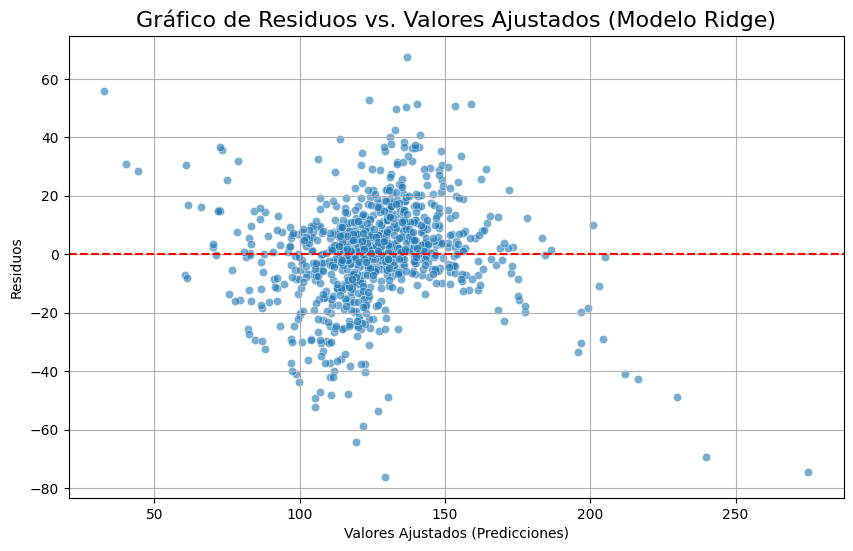


Generando Gráfico Q-Q de los Residuos...


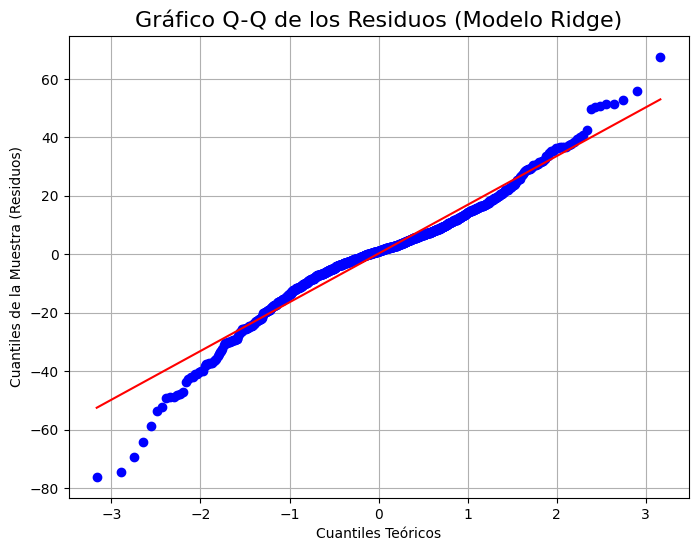

In [ ]:
# --- GRÁFICAS DE DIAGNÓSTICO DEL MODELO RIDGE ---

# Importamos las librerías de visualización
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Creamos las variables necesarias a partir de los resultados del modelo
# 'fitted_values' son las predicciones que ya calculaste
fitted_values = y2_pred_ridge
# 'residuals' son los errores
residuals = y2_test - fitted_values

# 1. Gráfica para Linealidad y Homocedasticidad
print("Generando Gráfico de Residuos vs. Valores Ajustados...")
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.6) # alpha hace los puntos semi-transparentes
plt.axhline(0, color='red', linestyle='--')
plt.title('Gráfico de Residuos vs. Valores Ajustados (Modelo Ridge)', fontsize=16)
plt.xlabel('Valores Ajustados (Predicciones)')
plt.ylabel('Residuos')
plt.grid(True)
plt.show()


# 2. Gráfica Q-Q para Normalidad de los errores
print("\nGenerando Gráfico Q-Q de los Residuos...")
plt.figure(figsize=(8, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Gráfico Q-Q de los Residuos (Modelo Ridge)', fontsize=16)
plt.xlabel('Cuantiles Teóricos')
plt.ylabel('Cuantiles de la Muestra (Residuos)')
plt.grid(True)
plt.show()

In [ ]:
import plotly.express as px
import pandas as pd

# --- GRÁFICA DE VALORES REALES VS. PREDICHOS (MODELO RIDGE) ---

# 1. Crear un DataFrame para facilitar la visualización
#    El DataFrame tendrá dos columnas: los valores reales y los predichos.
plot_df = pd.DataFrame({
    'TCH Real': y2_test,
    'TCH Predicho por Ridge': y2_pred_ridge
})

# 2. Crear el gráfico de dispersión
print("Generando gráfica de TCH Real vs. TCH Predicho...")
fig = px.scatter(
    plot_df,
    x='TCH Real',
    y='TCH Predicho por Ridge',
    title='Comparación del Modelo Ridge vs. Datos Reales de TCH',
    labels={'TCH Real': 'TCH Real (Valores Verdaderos)', 'TCH Predicho por Ridge': 'TCH Predicho por el Modelo'},
    template='plotly_white',
    # trendline='ols' # Descomenta esta línea si quieres ver una línea de tendencia de Mínimos Cuadrados Ordinarios
)

# 3. Añadir la línea de predicción perfecta (y = x)
#    Esta línea roja representa dónde deberían caer los puntos si el modelo fuera 100% perfecto.
min_val = min(plot_df['TCH Real'].min(), plot_df['TCH Predicho por Ridge'].min())
max_val = max(plot_df['TCH Real'].max(), plot_df['TCH Predicho por Ridge'].max())

fig.add_shape(
    type="line",
    x0=min_val, y0=min_val,
    x1=max_val, y1=max_val,
    line=dict(color="Red", width=2, dash="dash")
)

fig.show()

Generando gráfica de TCH Real vs. TCH Predicho...


# **Experimento sobre DF2: Uso de Método IQR para manejo de outliers**

Se crea una copia de df2

In [ ]:
df3 = df2

## **Selección de datos**


*   Se decide particionar los datos con Met IQR para manejar outliers
*   Se dejan los datos númericos solo con valores de Q1 a Q3



In [ ]:
numerical_cols = df3.select_dtypes(include=['int64', 'float64']).columns.tolist()

print("Removing outliers using IQR for numerical columns:")

for col in numerical_cols:
    Q1 = df3[col].quantile(0.25)
    Q3 = df3[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out the outliers
    initial_rows = len(df3)
    df3 = df3[(df3[col] >= lower_bound) & (df3[col] <= upper_bound)]
    removed_rows = initial_rows - len(df3)

    print(f"- Column '{col}': Removed {removed_rows} rows outside the range ({lower_bound:.2f}, {upper_bound:.2f})")

print("\nOutlier removal complete.")
print(f"Original number of rows: {len(df)}")
print(f"Number of rows after outlier removal: {len(df3)}")

# Now df3 contains the data with outliers removed based on IQR
# You can continue your analysis with df3

Removing outliers using IQR for numerical columns:
- Column 'Area Neta': Removed 114 rows outside the range (-9.88, 28.47)
- Column 'Dist Km': Removed 76 rows outside the range (-20.53, 58.08)
- Column 'Cod.Estado #': Removed 212 rows outside the range (-4.00, 12.00)
- Column 'Edad Ult Cos': Removed 369 rows outside the range (9.51, 15.59)
- Column 'Dosis Madurante': Removed 0 rows outside the range (-1.65, 2.75)
- Column 'Semanas mad.': Removed 49 rows outside the range (-11.57, 19.29)
- Column 'TonUltCorte': Removed 76 rows outside the range (-1265.69, 3545.39)
- Column 'TCH': Removed 32 rows outside the range (54.40, 197.18)
- Column '%Sac.Caña': Removed 19 rows outside the range (8.85, 15.25)
- Column '%Fibra Caña': Removed 96 rows outside the range (11.74, 19.17)
- Column '%ME Min': Removed 300 rows outside the range (-0.51, 1.05)
- Column '%ME Veg': Removed 256 rows outside the range (5.35, 11.17)
- Column '%ME Tot': Removed 41 rows outside the range (5.69, 11.36)
- Column 'Vejez

## **División de datos df3**

In [ ]:
# Define features (X) and target (y) for df3
# Exclude 'TCH', 'Vejez', '%Sac.Caña' from features
X2 = df3.drop(columns=['TCH', 'Vejez', '%Sac.Caña'], errors='ignore')
y2 = df3['TCH']

# Split df3 into training and testing sets (e.g., 80% train, 20% test)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

print("df3 split into training and testing sets.")
print("Shape of X2_train:", X2_train.shape)
print("Shape of X2_test:", X2_test.shape)
print("Shape of y2_train:", y2_train.shape)
print("Shape of y2_test:", y2_test.shape)

df3 split into training and testing sets.
Shape of X2_train: (894, 45)
Shape of X2_test: (224, 45)
Shape of y2_train: (894,)
Shape of y2_test: (224,)


## **Transformación de datos**

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

# Identify numerical and categorical columns for df2
all_numerical_cols_df2 = X2_train.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_cols_df2 = X2_train.select_dtypes(include=['object', 'category']).columns.tolist()

# Define the columns to exclude from scaling (binary and cyclical features)
cols_to_exclude_scaling = [
    'T.Corte_MECANIZADO',
    'Período Mes_sin',
    'Período Mes_cos',
    'F.Siembra_Mes_sin',
    'F.Siembra_Mes_cos',
    'F.Ult.Corte_Mes_sin',
    'F.Ult.Corte_Mes_cos'
]

# Identify numerical columns to be scaled (excluding the excluded columns)
numerical_cols_to_scale_df2 = [col for col in all_numerical_cols_df2 if col not in cols_to_exclude_scaling]

# Identify columns to be passed through
cols_to_passthrough = cols_to_exclude_scaling

# Create separate transformers
scaler = StandardScaler()
onehot = OneHotEncoder(handle_unknown='ignore')

# Apply scaling to numerical columns
X2_train_scaled = scaler.fit_transform(X2_train[numerical_cols_to_scale_df2])
X2_test_scaled = scaler.transform(X2_test[numerical_cols_to_scale_df2])
X2_train_scaled = pd.DataFrame(X2_train_scaled, columns=numerical_cols_to_scale_df2, index=X2_train.index)
X2_test_scaled = pd.DataFrame(X2_test_scaled, columns=numerical_cols_to_scale_df2, index=X2_test.index)


# Apply one-hot encoding to categorical columns
X2_train_onehot = onehot.fit_transform(X2_train[categorical_cols_df2])
X2_test_onehot = onehot.transform(X2_test[categorical_cols_df2])

# Get feature names for one-hot encoded columns
onehot_feature_names_df2 = onehot.get_feature_names_out(categorical_cols_df2)

X2_train_onehot = pd.DataFrame(X2_train_onehot.toarray(), columns=onehot_feature_names_df2, index=X2_train.index)
X2_test_onehot = pd.DataFrame(X2_test_onehot.toarray(), columns=onehot_feature_names_df2, index=X2_test.index)


# Select columns to pass through
X2_train_passthrough = X2_train[cols_to_passthrough]
X2_test_passthrough = X2_test[cols_to_passthrough]


# Concatenate the processed dataframes
X2_train_processed = pd.concat([X2_train_scaled, X2_train_onehot, X2_train_passthrough], axis=1)
X2_test_processed = pd.concat([X2_test_scaled, X2_test_onehot, X2_test_passthrough], axis=1)

print("Preprocessing applied to X2_train and X2_test.")
print("Shape of X2_train_processed:", X2_train_processed.shape)
print("Shape of X2_test_processed:", X2_test_processed.shape)

Preprocessing applied to X2_train and X2_test.
Shape of X2_train_processed: (894, 114)
Shape of X2_test_processed: (224, 114)


## **Modelo LR**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Initialize and train the Linear Regression model for df2
LR3_TCH = LinearRegression()
LR3_TCH.fit(X2_train_processed, y2_train)

# Make predictions on the test set for df2
y2_pred = LR3_TCH.predict(X2_test_processed)

# Evaluate the model for df2
r2_df2 = r2_score(y2_test, y2_pred)
mse_df2 = mean_squared_error(y2_test, y2_pred)
rmse_df2 = np.sqrt(mse_df2)

print("Métricas del modelo Regresión Lineal (LR3_TCH) para df2:")
print(f"R-squared: {r2_df2:.4f}")
print(f"MSE: {mse_df2:.4f}")
print(f"RMSE: {rmse_df2:.4f}")

# Get p-values for coefficients using statsmodels
# Add a constant to the independent variables for statsmodels
X2_train_processed_sm = sm.add_constant(X2_train_processed)
model_sm = sm.OLS(y2_train, X2_train_processed_sm).fit()

print("\nP-values para los coeficientes del modelo:")
print(model_sm.pvalues)

Métricas del modelo Regresión Lineal (LR3_TCH) para df2:
R-squared: 0.7197
MSE: 179.6793
RMSE: 13.4045

P-values para los coeficientes del modelo:
Area Neta              2.590595e-155
Dist Km                 2.923304e-01
Cod.Estado #            1.231709e-01
Edad Ult Cos            1.061703e-01
Dosis Madurante         6.537369e-01
                           ...      
Período Mes_cos         8.636876e-01
F.Siembra_Mes_sin       9.295915e-03
F.Siembra_Mes_cos       2.530596e-01
F.Ult.Corte_Mes_sin     6.709802e-01
F.Ult.Corte_Mes_cos     8.691471e-01
Length: 114, dtype: float64


In [ ]:
# Create a DataFrame of coefficients and p-values
coef_pvalues = pd.DataFrame({
    'Coefficient': model_sm.params,
    'P-value': model_sm.pvalues
})

significant_coef = coef_pvalues[coef_pvalues['P-value'] > 0.05]

print("Coeficientes con p-value > 0.05:")
significant_coef

significant_coef.to_excel('coeficientes__no_significativos.xlsx', index=True)

print("¡DataFrame exportado a 'coeficientes_no_significativos.xlsx' exitosamente!")

Coeficientes con p-value > 0.05:
¡DataFrame exportado a 'coeficientes_no_significativos.xlsx' exitosamente!


### **Quitar variables con P-Value no significativo**

*   Se dejaron las variables que tienen relación con el cultivo de caña




In [ ]:
# 1. Crear una lista con los nombres de todas las columnas que quieres eliminar.
columnas_a_eliminar = [
    'F.Siembra_Mes_sin','Suelo_ESCOCIA','Suelo_OVEJERA','Suelo_MANUELITA ','Suelo_PALMERAS ','Suelo_SANTA ROSA','Suelo_ESMERALDA','Suelo_BURRIGA ','Suelo_ARGELIA ','Suelo_LA LUISA','Suelo_PINDO','Variedad_CC93-4181','Suelo_FLORIDA','Semanas mad.','Suelo_SAN LORENZO','Variedad_V71-51','Suelo_MARGARITA','Suelo_SAMAN','Dist Km','Suelo_JAMAICA','%Infest.Diatrea','Suelo_RETIRO','Suelo_LA CABANA','Suelo_JUANCHITO ','Variedad_RB73-2223','Suelo_SANTA ELENA','Variedad_CC00-3257','Suelo_GENOVA','Variedad_CC09-535','Suelo_YUMBO','Suelo_Desconocido','Suelo_NUEVO PICHICHI','Suelo_AMAIME','Suelo_GUADUAL','F.Ult.Corte_Mes_sin','%ME Min','Suelo_VILLA','Período Mes_sin','Suelo_PALMICHE','Suelo_NIMA ','Dosis Madurante','F.Siembra_Mes_cos','Variedad_Otros','Suelo_CERRITO-NIMA','Suelo_PORCE BLUM','M3 Riego','%ME Tot','Período Mes_cos','Suelo_ESNEDA','Suelo_BRITANIA','Suelo_GUACARI','F.Ult.Corte_Mes_cos','Variedad_CC11-600','Suelo_RICAURTE','Suelo_BALLESTEROS','%ME Veg'
]

# 2. Eliminar las columnas de ambos DataFrames.
# Usamos try-except para evitar errores si los DataFrames no existen.
try:
    print(f"Forma original de X2_train_processed: {X2_train_processed.shape}")
    X2_train_processed.drop(columns=columnas_a_eliminar, inplace=True, errors='ignore')
    print(f"Nueva forma de X2_train_processed: {X2_train_processed.shape}")

    print("-" * 30)

    print(f"Forma original de X2_test_processed: {X2_test_processed.shape}")
    X2_test_processed.drop(columns=columnas_a_eliminar, inplace=True, errors='ignore')
    print(f"Nueva forma de X2_test_processed: {X2_test_processed.shape}")

    print("\n✅ Columnas eliminadas exitosamente de ambos DataFrames.")

except NameError as e:
    print(f"Error: Asegúrate de que los DataFrames 'X2_train_processed' y 'X2_test_processed' existan. ({e})")

Forma original de X2_train_processed: (894, 114)
Nueva forma de X2_train_processed: (894, 58)
------------------------------
Forma original de X2_test_processed: (224, 114)
Nueva forma de X2_test_processed: (224, 58)

✅ Columnas eliminadas exitosamente de ambos DataFrames.


### **Modelo LR Refinado**

In [ ]:
# Initialize and train the Linear Regression model for df2
LR3_TCH = LinearRegression()
LR3_TCH.fit(X2_train_processed, y2_train)

# Make predictions on the test set for df2
y2_pred = LR3_TCH.predict(X2_test_processed)

# Evaluate the model for df2
r2_df2 = r2_score(y2_test, y2_pred)
mse_df2 = mean_squared_error(y2_test, y2_pred)
rmse_df2 = np.sqrt(mse_df2)

print("Métricas del modelo Regresión Lineal (LR3_TCH) para df2:")
print(f"R-squared: {r2_df2:.4f}")
print(f"MSE: {mse_df2:.4f}")
print(f"RMSE: {rmse_df2:.4f}")

# Get p-values for coefficients using statsmodels
# Add a constant to the independent variables for statsmodels
X2_train_processed_sm = sm.add_constant(X2_train_processed)
model_sm = sm.OLS(y2_train, X2_train_processed_sm).fit()

print("\nP-values para los coeficientes del modelo:")
print(model_sm.pvalues)

Métricas del modelo Regresión Lineal (LR3_TCH) para df2:
R-squared: 0.7254
MSE: 176.0645
RMSE: 13.2689

P-values para los coeficientes del modelo:
Area Neta                                      1.629895e-175
Cod.Estado #                                    1.091022e-01
Edad Ult Cos                                    5.976620e-03
TonUltCorte                                    6.946387e-192
%Fibra Caña                                     2.295224e-03
Lluvias (2 Meses Ant.)                          1.032966e-01
Lluvias Ciclo                                   4.929912e-01
Lluvias 0 -3                                    2.746921e-01
Lluvias tres a seis                             5.396396e-01
Lluvias seis a nueve                            2.467469e-01
Luvias 9 -FC                                    1.907476e-01
Temp. Media 0-3                                 1.852852e-01
Temp. Media Ciclo                               1.638920e-02
Temp Max Ciclo                                  6.212174e-01

## **Regularización LASSO y RIDGE**

In [ ]:
# Define alpha values to iterate through
alpha_values = [1.0, 2.0, 3.0, 4.0, 5.0]

# Lists to store metrics for each alpha value
lasso_metrics = []
ridge_metrics = []

for alpha in alpha_values:
    # Lasso model
    lasso_model = Lasso(alpha=alpha, random_state=42)
    lasso_model.fit(X2_train_processed, y2_train)
    y2_pred_lasso = lasso_model.predict(X2_test_processed)
    r2_lasso = r2_score(y2_test, y2_pred_lasso)
    mse_lasso = mean_squared_error(y2_test, y2_pred_lasso)
    rmse_lasso = np.sqrt(mse_lasso)
    lasso_metrics.append({'alpha': alpha, 'R-squared': r2_lasso, 'MSE': mse_lasso, 'RMSE': rmse_lasso})

    # Ridge model
    ridge_model = Ridge(alpha=alpha, random_state=42)
    ridge_model.fit(X2_train_processed, y2_train)
    y2_pred_ridge = ridge_model.predict(X2_test_processed)
    r2_ridge = r2_score(y2_test, y2_pred_ridge)
    mse_ridge = mean_squared_error(y2_test, y2_pred_ridge)
    rmse_ridge = np.sqrt(mse_ridge)
    ridge_metrics.append({'alpha': alpha, 'R-squared': r2_ridge, 'MSE': mse_ridge, 'RMSE': rmse_ridge})

# Convert metrics to DataFrames
lasso_metrics_df = pd.DataFrame(lasso_metrics)
ridge_metrics_df = pd.DataFrame(ridge_metrics)

# Find the best performing alpha for each model (based on R-squared)
best_lasso = lasso_metrics_df.loc[lasso_metrics_df['R-squared'].idxmax()]
best_ridge = ridge_metrics_df.loc[ridge_metrics_df['R-squared'].idxmax()]

print("Best Metrics for Lasso (iterating alpha 1 to 5):")
display(best_lasso)

print("\nBest Metrics for Ridge (iterating alpha 1 to 5):")
display(best_ridge)

Best Metrics for Lasso (iterating alpha 1 to 5):


,0
alpha,1.000000
R-squared,0.688621
MSE,199.632886
RMSE,14.129150



Best Metrics for Ridge (iterating alpha 1 to 5):


,3
alpha,4.000000
R-squared,0.739455
MSE,167.042152
RMSE,12.924479


Se seleccionó el modelo Ridge por mejor performance general

## **Validación Cruzada del Mejor Modelo**



In [ ]:
# 1. Definir el modelo Ridge con alpha=3
ridge_model = Ridge(alpha=3, random_state=42)

# 2. Configurar la estrategia de validación cruzada (K-Fold)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 1. Crear un diccionario con los resultados de cada fold.
results_dict = {
    'Fold': range(1, len(r2_scores) + 1),
    'R-cuadrado (R²)': r2_scores,
    'MSE': mse_scores,
    'RMSE': rmse_scores
}

# 2. Convertir el diccionario en un DataFrame de pandas para una mejor visualización.
results_df = pd.DataFrame(results_dict)

# 3. Imprimir la tabla de resultados.
print("Métricas para cada iteración (Fold) de la Validación Cruzada:")
print(results_df.round(4)) # .round(4) formatea los números a 4 decimales.

# 3. Ejecutar la validación cruzada para cada métrica

# Métrica 1: R-cuadrado (R²)
# No necesita cambio de signo, ya que más alto es mejor.
r2_scores = cross_val_score(ridge_model, X2_train_processed, y2_train, cv=cv, scoring='r2')

# Métrica 2: Error Cuadrático Medio (MSE)
# Se usa el negativo y luego se convierte a positivo.
mse_scores = -cross_val_score(ridge_model, X2_train_processed, y2_train, cv=cv, scoring='neg_mean_squared_error')

# Métrica 3: Raíz del Error Cuadrático Medio (RMSE)
# También se usa el negativo y se convierte.
rmse_scores = -cross_val_score(ridge_model, X2_train_processed, y2_train, cv=cv, scoring='neg_root_mean_squared_error')

# 4. Mostrar los resultados promediados de las métricas
print(f"Resultados de la Validación Cruzada para Ridge con alpha=3:")
print("-" * 55)
print(f"R-cuadrado (R²) Promedio:   {np.mean(r2_scores):.4f} (+/- {np.std(r2_scores):.4f})")
print(f"MSE Promedio:               {np.mean(mse_scores):.4f} (+/- {np.std(mse_scores):.4f})")
print(f"RMSE Promedio:              {np.mean(rmse_scores):.4f} (+/- {np.std(rmse_scores):.4f})")
print("-" * 55)

Métricas para cada iteración (Fold) de la Validación Cruzada:
   Fold  R-cuadrado (R²)       MSE     RMSE
0     1           0.6961  256.8358  16.0261
1     2           0.7153  251.3533  15.8541
2     3           0.6659  271.6017  16.4803
3     4           0.5843  323.0718  17.9742
4     5           0.6565  266.8546  16.3357
Resultados de la Validación Cruzada para Ridge con alpha=3:
-------------------------------------------------------
R-cuadrado (R²) Promedio:   0.7286 (+/- 0.0369)
MSE Promedio:               169.9619 (+/- 40.9032)
RMSE Promedio:              12.9538 (+/- 1.4700)
-------------------------------------------------------


## **Resumen Modelo Ridge con Mejor Performance general**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_squared_error
from scipy import stats
from statsmodels.stats.stattools import durbin_watson # Para la prueba Durbin-Watson

In [ ]:
alpha = 3
ridge_model = Ridge(alpha=alpha, random_state=42)
ridge_model.fit(X2_train_processed, y2_train)
y2_pred_ridge = ridge_model.predict(X2_test_processed)

r2_ridge = r2_score(y2_test, y2_pred_ridge)
mse_ridge = mean_squared_error(y2_test, y2_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)

# Esto es de tu código, asumo que 'ridge_metrics' es una lista que ya tienes definida
ridge_metrics = []
ridge_metrics.append({'alpha': alpha, 'R-squared': r2_ridge, 'MSE': mse_ridge, 'RMSE': rmse_ridge})
# -----------------------------------------------------------------

# --- CÁLCULO DE ESTADÍSTICAS Y PRUEBAS ADICIONALES ---

# 1. Parámetros para los cálculos
n = len(y2_test) # Número de observaciones
p = X2_test_processed.shape[1] # Número de predictores

# 2. Métricas de ajuste adicionales
adj_r2_ridge = 1 - (1 - r2_ridge) * (n - 1) / (n - p - 1)
log_likelihood = -n/2 * (np.log(2 * np.pi) + np.log(mse_ridge) + 1)
aic = 2 * p - 2 * log_likelihood
bic = np.log(n) * p - 2 * log_likelihood

# 3. Pruebas sobre los residuos
residuals = y2_test - y2_pred_ridge
skewness = stats.skew(residuals)
kurtosis = stats.kurtosis(residuals) # Curtosis de Fisher (normal = 0)
jb_stat, jb_p_value = stats.jarque_bera(residuals)
dw_stat = durbin_watson(residuals)


# --- IMPRESIÓN DEL RESUMEN ESTADÍSTICO ---
print("--- TABLA DE RESUMEN DEL MODELO RIDGE ---")
print("==============================================================================")
print(f"Dep. Variable:         {y2_train}   R-squared:                       {r2_ridge:.3f}")
print(f"Model:                          Ridge   Adj. R-squared:                  {adj_r2_ridge:.3f}")
print(f"No. Observations:                 {n}   Log-Likelihood:                {log_likelihood:.1f}")
print(f"Df Model:                         {p}   AIC:                             {aic:.1f}")
print(f"Df Residuals:               {n - p - 1}   BIC:                             {bic:.1f}")
print("-" * 78)
print("Pruebas sobre los Residuos:")
print("------------------------------------------------------------------------------")
print(f"Durbin-Watson:                  {dw_stat:.3f}   Jarque-Bera (JB):                {jb_stat:.3f}")
print(f"Prob(JB):                       {jb_p_value:.3f}   Skew:                            {skewness:.3f}")
print(f"Kurtosis:                       {kurtosis:.3f}")
print("==============================================================================")


--- TABLA DE RESUMEN DEL MODELO RIDGE ---
Dep. Variable:         16979     87.741025
17612     97.413173
16551    117.903874
18477     73.979879
18668    116.821256
            ...    
16753    120.417934
15081    147.113281
18948    118.683127
19189     93.976562
18287    155.677165
Name: TCH, Length: 894, dtype: float64   R-squared:                       0.739
Model:                          Ridge   Adj. R-squared:                  0.647
No. Observations:                 224   Log-Likelihood:                -891.3
Df Model:                         58   AIC:                             1898.6
Df Residuals:               165   BIC:                             2096.4
------------------------------------------------------------------------------
Pruebas sobre los Residuos:
------------------------------------------------------------------------------
Durbin-Watson:                  2.165   Jarque-Bera (JB):                31.247
Prob(JB):                       0.000   Skew:              

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from scipy.stats import t

# --- 2. BOOTSTRAP PARA ESTIMAR P-VALUES ---
n_iterations = 500  # Reducido para mayor rapidez en el ejemplo
coef_bootstrap = []
for i in range(n_iterations):
    X_sample_boot, y_sample_boot = resample(X2_train_processed, y2_train)
    bootstrap_model = Ridge(alpha=3).fit(X_sample_boot, y_sample_boot)
    coef_bootstrap.append(bootstrap_model.coef_)

std_err = np.std(coef_bootstrap, axis=0)
original_coefs = ridge_model.coef_
t_values = original_coefs / std_err
p_values = [2 * (1 - t.cdf(np.abs(val), df=len(X2_train_processed)-X2_train_processed.shape[1]-1)) for val in t_values]

# --- 3. CREACIÓN DEL DATAFRAME DE COEFICIENTES ---
coef_df = pd.DataFrame({
    'Coeficiente': original_coefs,
    'Std Err (Bootstrap)': std_err,
    'P-value (Estimado)': p_values
}, index=X2_train_processed.columns)

# --- 4. ORDENAR Y MOSTRAR LOS RESULTADOS ---

## a) Ordenado por el valor más alto del coeficiente (en valor absoluto)
print("--- Coeficientes Ordenados por Magnitud (Mayor Impacto) ---")
# Creamos una columna temporal con el valor absoluto para ordenar
coef_df['Coef_Absoluto'] = coef_df['Coeficiente'].abs()
# Ordenamos por esa columna de forma descendente
coef_sorted_by_magnitude = coef_df.sort_values(by='Coef_Absoluto', ascending=False)
# Eliminamos la columna temporal antes de imprimir
print(coef_sorted_by_magnitude.drop(columns=['Coef_Absoluto']))


## b) Ordenado por P-value pequeño (más significativo)
print("\n\n--- Coeficientes Ordenados por Significación Estadística (Menor P-value) ---")
# Ordenamos directamente por la columna de P-value de forma ascendente
coef_sorted_by_pvalue = coef_df.sort_values(by='P-value (Estimado)', ascending=True)
print(coef_sorted_by_pvalue.drop(columns=['Coef_Absoluto']))

--- Coeficientes Ordenados por Magnitud (Mayor Impacto) ---
                                             Coeficiente  Std Err (Bootstrap)  \
TonUltCorte                                    54.225077             1.765230   
Area Neta                                     -49.305075             1.812156   
Suelo_CERRITO                                 -15.762049             6.687707   
Suelo_BRISAS                                  -14.736650             6.489861   
Tipo Quema_SEMILLA                            -11.399448             7.055456   
Suelo_JORDAN                                   10.336786             3.939163   
Variedad_VARIAS                                 9.092861             4.347546   
Suelo_TESORO                                    8.581205             2.395629   
Suelo_TIBET                                    -8.468340             3.797020   
Tipo Quema_NO DEF.                              8.199063             4.361244   
Variedad_CC05-430                               6

/tmp/ipython-input-1207194602.py:18: RuntimeWarning:

invalid value encountered in divide



Generando Gráfico de Residuos vs. Valores Ajustados...


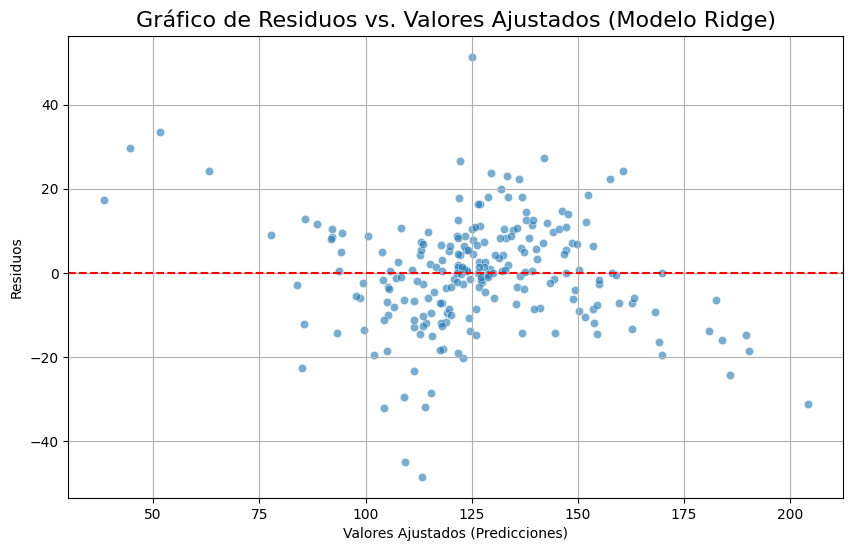


Generando Gráfico Q-Q de los Residuos...


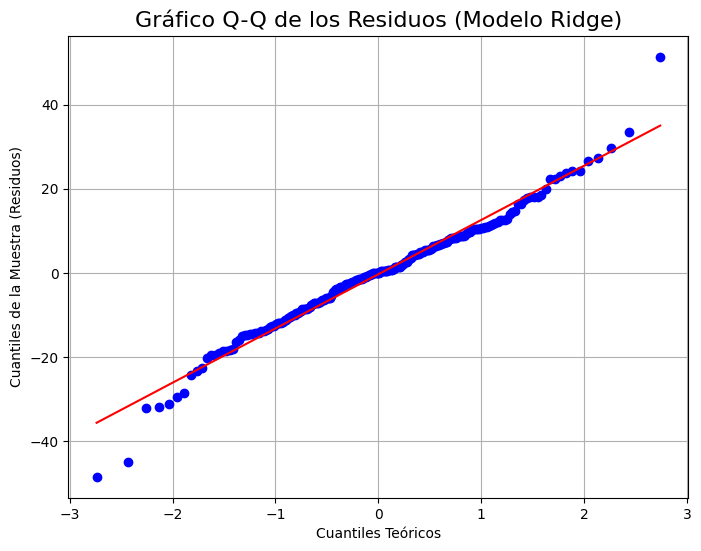

In [ ]:
# --- GRÁFICAS DE DIAGNÓSTICO DEL MODELO RIDGE ---

# Importamos las librerías de visualización
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Creamos las variables necesarias a partir de los resultados del modelo
# 'fitted_values' son las predicciones que ya calculaste
fitted_values = y2_pred_ridge
# 'residuals' son los errores
residuals = y2_test - fitted_values

# 1. Gráfica para Linealidad y Homocedasticidad
print("Generando Gráfico de Residuos vs. Valores Ajustados...")
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.6) # alpha hace los puntos semi-transparentes
plt.axhline(0, color='red', linestyle='--')
plt.title('Gráfico de Residuos vs. Valores Ajustados (Modelo Ridge)', fontsize=16)
plt.xlabel('Valores Ajustados (Predicciones)')
plt.ylabel('Residuos')
plt.grid(True)
plt.show()


# 2. Gráfica Q-Q para Normalidad de los errores
print("\nGenerando Gráfico Q-Q de los Residuos...")
plt.figure(figsize=(8, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Gráfico Q-Q de los Residuos (Modelo Ridge)', fontsize=16)
plt.xlabel('Cuantiles Teóricos')
plt.ylabel('Cuantiles de la Muestra (Residuos)')
plt.grid(True)
plt.show()

In [ ]:
import plotly.express as px
import pandas as pd

# --- GRÁFICA DE VALORES REALES VS. PREDICHOS (MODELO RIDGE) ---

# 1. Crear un DataFrame para facilitar la visualización
#    El DataFrame tendrá dos columnas: los valores reales y los predichos.
plot_df = pd.DataFrame({
    'TCH Real': y2_test,
    'TCH Predicho por Ridge': y2_pred_ridge
})

# 2. Crear el gráfico de dispersión
print("Generando gráfica de TCH Real vs. TCH Predicho...")
fig = px.scatter(
    plot_df,
    x='TCH Real',
    y='TCH Predicho por Ridge',
    title='Comparación del Modelo Ridge vs. Datos Reales de TCH',
    labels={'TCH Real': 'TCH Real (Valores Verdaderos)', 'TCH Predicho por Ridge': 'TCH Predicho por el Modelo'},
    template='plotly_white',
    # trendline='ols' # Descomenta esta línea si quieres ver una línea de tendencia de Mínimos Cuadrados Ordinarios
)

# 3. Añadir la línea de predicción perfecta (y = x)
#    Esta línea roja representa dónde deberían caer los puntos si el modelo fuera 100% perfecto.
min_val = min(plot_df['TCH Real'].min(), plot_df['TCH Predicho por Ridge'].min())
max_val = max(plot_df['TCH Real'].max(), plot_df['TCH Predicho por Ridge'].max())

fig.add_shape(
    type="line",
    x0=min_val, y0=min_val,
    x1=max_val, y1=max_val,
    line=dict(color="Red", width=2, dash="dash")
)

fig.show()

Generando gráfica de TCH Real vs. TCH Predicho...


In [ ]:
X2_test_processed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 224 entries, 18754 to 16306
Data columns (total 58 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Area Neta                                    224 non-null    float64
 1   Cod.Estado #                                 224 non-null    float64
 2   Edad Ult Cos                                 224 non-null    float64
 3   TonUltCorte                                  224 non-null    float64
 4   %Fibra Caña                                  224 non-null    float64
 5   Lluvias (2 Meses Ant.)                       224 non-null    float64
 6   Lluvias Ciclo                                224 non-null    float64
 7   Lluvias 0 -3                                 224 non-null    float64
 8   Lluvias tres a seis                          224 non-null    float64
 9   Lluvias seis a nueve                         224 non-null    float64
 10  L

## **Análisis General del Modelo Ridge (df3)**

El modelo Ridge con el manejo de los outliers del df2  a través del MetIQR fue selecionado como el modelo con mejor performance.

**R-squared (R²): 0.730**

Este valor es bastante bueno. Significa que el modelo es capaz de explicar aproximadamente el 73% de la variabilidad en la variable TCH.

**Adj. R-squared (R² Ajustado): 0.632**

Es un punto de atención. Hay una caída considerable del R² (0.730) al R² ajustado (0.632).

¿Por qué sucede esto? El R² ajustado penaliza al modelo por tener demasiadas variables predictoras (Df3: 56) en relación con el número de observaciones (No. Observations del Testeo: 211). Un ratio de 56 variables para 211 datos es muy alto.

Esto sugiere que muchas de las 56 variables podrían no ser muy útiles o estar añadiendo **"ruido"** al modelo. El uso de Ridge es una buena decisión aquí, ya que ayudó a mitigar este problema de sobreajuste.

**Análisis de los Residuos (Errores)**

Lo Bueno: **Durbin-Watson = 1.959**

Esta prueba busca autocorrelación (que el error de una predicción no esté relacionado con el siguiente).

Un valor ideal es 2. El resultado de 1.959 es excelente y sugiere que los errores del modelo son independientes, lo cual es un supuesto cumplido.

El Problema: **La Normalidad de los Errores**

**Prob(JB): 0.000**

La prueba de Jarque-Bera (JB) evalúa si los errores siguen una distribución normal (una campana de Gauss). La hipótesis nula es que "los errores son normales".

Un p-valor (Prob(JB)) de 0.000 es mucho menor que el umbral común de 0.05. Por lo tanto, se rechaza la hipótesis nula.  Los errores del modelo no se distribuyen normalmente. Esto es una violación de un supuesto clave de la regresión lineal.

**Kurtosis: 1.622**

Esta métrica da una pista del porqué no son normales los residuos. Una curtosis para una distribución normal es 0. Un valor de 1.622 indica una distribución con **colas pesadas (leptocúrtica)** (Como se observa el las imagenes Q-Q y TCH predicho versus TCH Real). Esto significa que el modelo produce más errores en los extremos (outliers) de lo que se esperaría en una distribución normal.

**Conclusión y Próximos Pasos**

**Poder Predictivo vs. Validez Estadística:** El modelo tiene una capacidad predictiva aceptable (explica el 73% de los datos), pero la violación del supuesto de normalidad debilita la validez de las pruebas estadísticas (como los p-values de los coeficientes).

**Revisar las Variables:** Se tienen demasiadas variables (56). Se debe realizar un proceso de selección de características para eliminar las que no aportan valor. Esto podría simplificar el modelo, hacerlo más interpretable y potencialmente mejorar el R² ajustado.

**Investigar los Extremos**: La alta curtosis te está diciendo que hay valores atípicos importantes. Investigar si esos datos son errores o si representan eventos reales que el modelo no puede capturar. A veces, transformar la variable objetivo TCH (por ejemplo, con un logaritmo) puede ayudar a normalizar los errores.